# Train

## Setup

In [ ]:
from katlas.core import *
import pandas as pd
import joblib
# from sklearn import set_config
# set_config(transform_output='pandas')

In [ ]:
df = Data.get_ks_unique()

In [ ]:
df

,site_seq,site_source_all,substrate_gene,sub_site,O00141_SGK1,O00238_BMPR1B,O00311_CDC7,O00329_PIK3CD,O00418_EEF2K,O00443_PIK3C2A,...,Q9Y2K2_SIK3,Q9Y2U5_MAP3K2,Q9Y3S1_WNK2,Q9Y463_DYRK1B,Q9Y4K4_MAP4K5,Q9Y572_RIPK3,Q9Y5S2_CDC42BPB,Q9Y6E0_STK24,Q9Y6M4_CSNK1G3,Q9Y6R4_MAP3K4
0,AAAAAAAAAVAAPPTAVGSLsGAEGVPVSsQPLPSQPW___,SIGNOR|human_phosphoproteome|PSP|iPTMNet,MAZ,P56270_S460,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,AAAAAAASGGAQQRsHHAPMsPGssGGGGQPLARtPQPssP,PSP|human_phosphoproteome|EPSD|Sugiyama,ARID1A,O14497_S363,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,AAAAAAAVtAAstsYYGRDRsPLRRATAPVPTVGEGYGYGH,human_phosphoproteome|PSP|EPSD,RBM4,Q9BWF3_S309,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,AAAAAVSRRRKAEYPRRRRssPsARPPDVPGQQPQAAKsPs,human_phosphoproteome|Sugiyama,ZFP91,Q96JP5_S83,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,AAAAGAGKAEELHyPLGERRsDyDREALLGVQEDVDEyVKL,Sugiyama,RCN2,Q14257_S37,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29151,___________________MstVHEILCKLsLEGDHstPPs,SIGNOR|human_phosphoproteome|EPSD,ANXA2,P07355_S2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29152,___________________MsYRRELEKyRDLDEDEILGAL,human_phosphoproteome|PSP|EPSD,TMOD1,P28289_S2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29153,___________________MtAKMETtFYDDALNASFLPSE,SIGNOR|human_phosphoproteome|EPSD|PSP|GPS6,JUN,P05412_T2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29154,___________________MtSSyGHVLERQPALGGRLDsP,Sugiyama,PRRX1,P54821_T2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
onehot_encode??

Signature: onehot_encode(sequences, transform_colname=True, n=20)
Docstring: <no docstring>
Source:   
def onehot_encode(sequences, transform_colname=True, n=20):
    encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
    encoded_array = encoder.fit_transform([list(seq) for seq in sequences])
    colnames = [x[1:] for x in encoder.get_feature_names_out()]
    if transform_colname:
        colnames = [f"{int(item.split('_', 1)[0]) - 20}{item.split('_', 1)[1]}" for item in colnames]
    encoded_df = pd.DataFrame(encoded_array, columns=colnames)
    return encoded_df
File:      ~/katlas/katlas/core.py
Type:      function

In [ ]:
X = onehot_encode(df['site_seq'])

In [ ]:
X

,-20A,-20C,-20D,-20E,-20F,-20G,-20H,-20I,-20K,-20L,...,20R,20S,20T,20V,20W,20Y,20_,20s,20t,20y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29151,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
29152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
kinase_cols = df.columns[4:] 
data=(df[kinase_cols]>0).astype(int)

In [ ]:
(data.sum()>50).value_counts()

True     320
False    135
Name: count, dtype: int64

In [ ]:
Y=data.loc[:,data.sum()>50] # filter out kinases with less than 50 known substrates

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [ ]:
# Wrap XGBClassifier with MultiOutputClassifier
model = MultiOutputClassifier(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
model.fit(X_train, Y_train)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [01:40:03] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [01:40:04] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [01:40:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [01:40:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fo

NameError: name 'shap' is not defined

In [ ]:
joblib.dump(model, 'multioutput_xgb_model.pkl')

['multioutput_xgb_model.pkl']

In [ ]:
model = joblib.load('multioutput_xgb_model.pkl')

In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(model.estimators_[46])

In [ ]:
shap_values = explainer.shap_values(X)

In [ ]:
shap_values.shape

(29156, 962)

In [ ]:
shap_df = pd.DataFrame(shap_values,index=X.index,columns=X.columns)

In [ ]:
df.columns[df.columns.str.contains('CDK1')]

Index(['O94921_CDK14', 'P06493_CDK1', 'P21127_CDK11B', 'Q00536_CDK16',
       'Q07002_CDK18', 'Q14004_CDK13', 'Q15131_CDK10', 'Q96Q40_CDK15',
       'Q9BWU1_CDK19', 'Q9NYV4_CDK12', 'Q9UQ88_CDK11A'],
      dtype='object')

In [ ]:
colname = 'P06493_CDK1'

In [ ]:
get_prob??

Signature:
get_prob(
    df: pandas.core.frame.DataFrame,
    col: str,
    aa_order=['P', 'G', 'A', 'C', 'S', 'T', 'V', 'I', 'L', 'M', 'F', 'Y', 'W', 'H', 'K', 'R', 'Q', 'N', 'D', 'E', 's', 't', 'y'],
)
Source:   
def get_prob(df: pd.DataFrame, col: str, aa_order=[i for i in 'PGACSTVILMFYWHKRQNDEsty']):
    """Get the probability matrix of PSSM from phosphorylation site sequences."""
    
    site = check_seq_df(df, col)
    
    site_array = np.array(site.apply(list).tolist())
    seq_len = site_array.shape[1]
    
    position = list(range(-(seq_len // 2), (seq_len // 2)+1)) # add 1 because range do not include the final num
    
    site_df = pd.DataFrame(site_array, columns=position)
    melted = site_df.melt(var_name='Position', value_name='aa')
    
    grouped = melted.groupby(['Position', 'aa']).size().reset_index(name='Count')
    grouped = grouped[grouped.aa.isin(aa_order)].reset_index(drop=True)
    
    pivot_df = grouped.pivot(index='aa', columns='Position', values='Count

In [ ]:
idxs = df.index[df[colname]==1]

In [ ]:
flat_pssm = shap_df.iloc[idxs].mean()

In [ ]:
flat_pssm_1 = (X*shap_df).mean()
flat_pssm_0 = ((1-X)*shap_df).mean()

In [ ]:
pssm_1 = recover_pssm(flat_pssm_1)
pssm_0 = recover_pssm(flat_pssm_0)

In [ ]:
from katlas.plot import *

<Axes: >

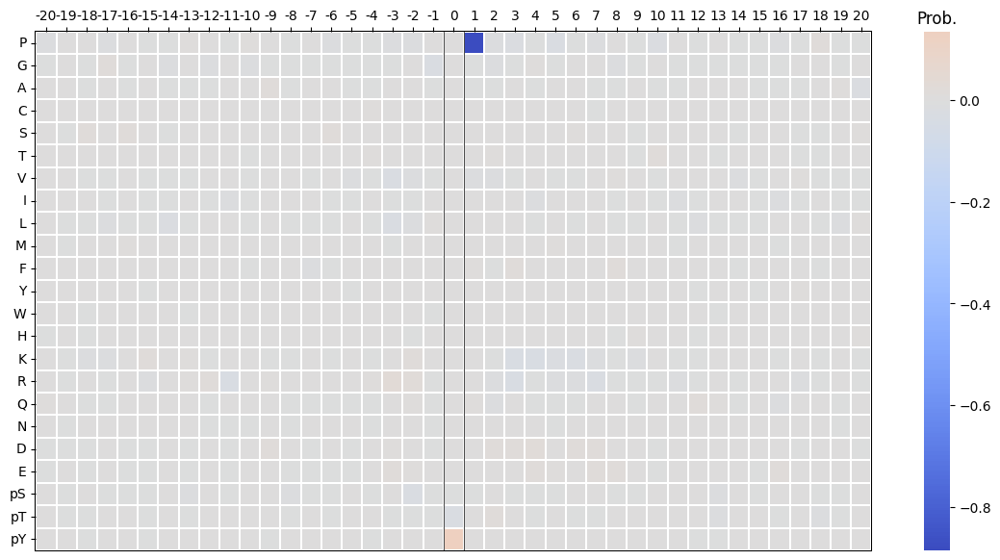

In [ ]:
plot_heatmap(pssm_0,figsize=(14,7))

<Axes: >

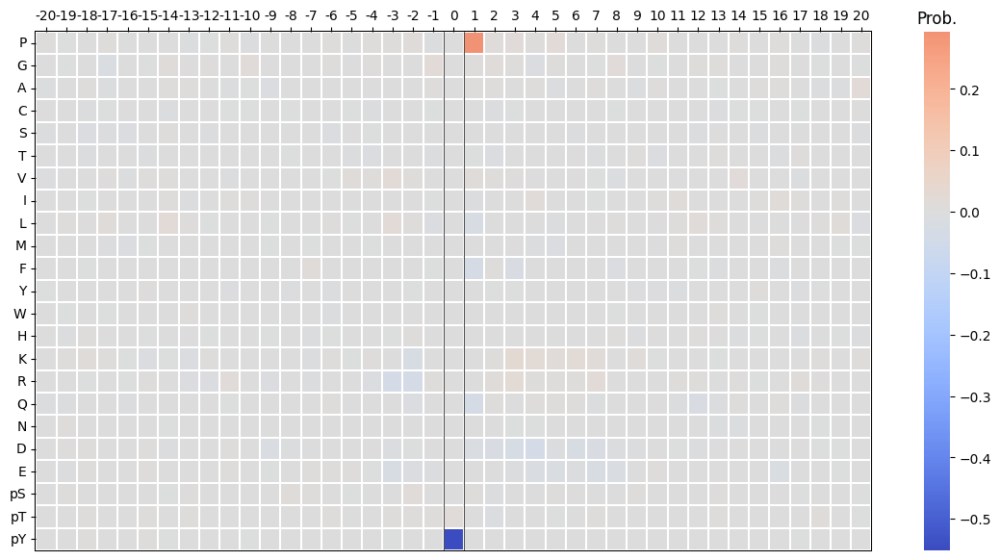

In [ ]:
plot_heatmap(pssm_1,figsize=(14,7))

In [ ]:
recover_pssm?

Signature: recover_pssm(flat_pssm: pandas.core.series.Series)
Docstring: Recover 2D pssm from flat pssm Series
File:      ~/katlas/katlas/core.py
Type:      function

In [ ]:
X.shape

(29156, 962)

In [ ]:
shap.force_plot?

Signature:
shap.force_plot(
    base_value,
    shap_values=None,
    features=None,
    feature_names=None,
    out_names=None,
    link='identity',
    plot_cmap='RdBu',
    matplotlib=False,
    show=True,
    figsize=(20, 3),
    ordering_keys=None,
    ordering_keys_time_format=None,
    text_rotation=0,
    contribution_threshold=0.05,
)
Docstring:
Visualize the given SHAP values with an additive force layout.

Parameters
----------
base_value : float or shap.Explanation
    If a float is passed in, this is the reference value that the feature contributions start from.
    For SHAP values, it should be the value of ``explainer.expected_value``.
    However, it is recommended to pass in a SHAP :class:`.Explanation` object instead (``shap_values``
    is not necessary in this case).

shap_values : numpy.array
    Matrix of SHAP values (# features) or (# samples x # features). If this is a
    1D array, then a single force plot will be drawn. If it is a 2D array, then a
    stacked 

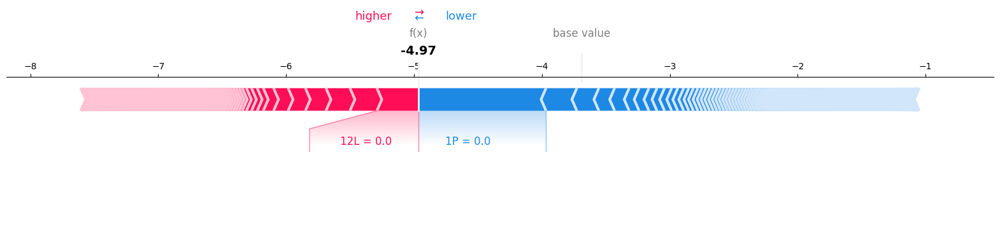

In [ ]:
shap.force_plot(explainer.expected_value, shap_values[0],X_train.iloc[0],matplotlib=True)

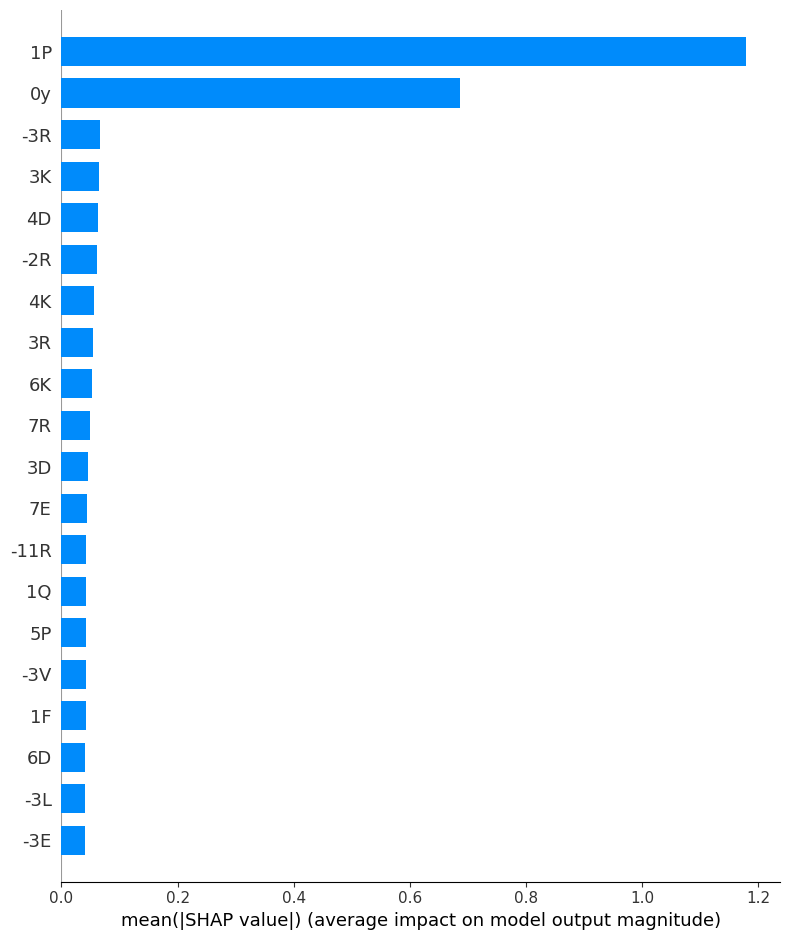

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

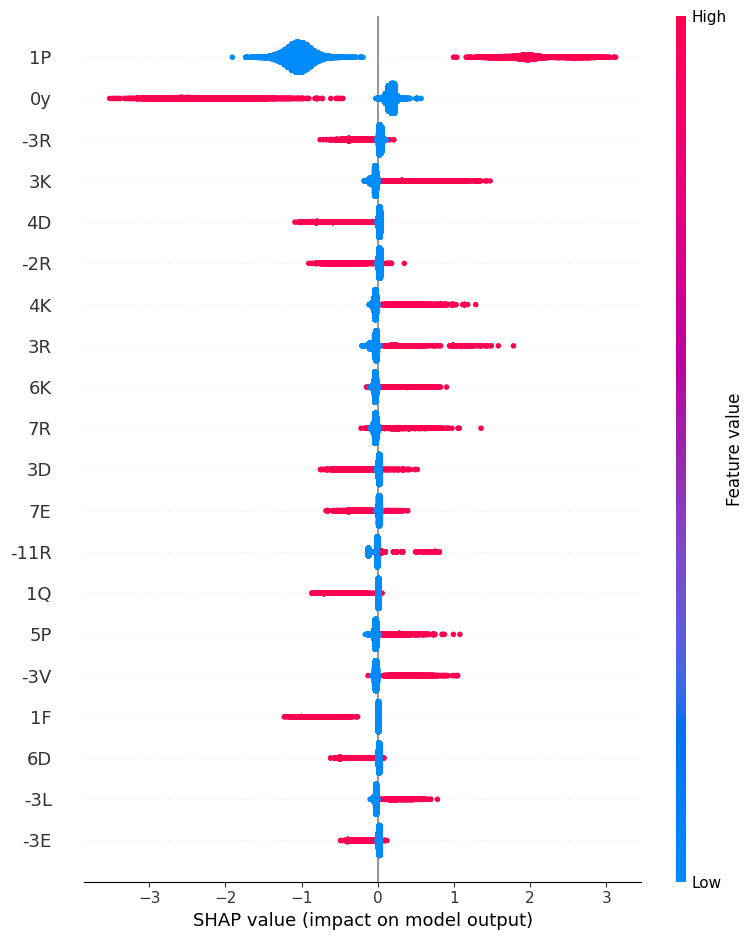

In [ ]:
shap.summary_plot(shap_values, X)


In [ ]:
explainer.expected_value

-3.6888542

In [ ]:
explainer = shap.Explainer(model.estimators_[46], X_train)
shap_test = explainer(X_test)
# shap_train = explainer(X_train)

In [ ]:
shap_test

.values =
array([[ 0.00206763,  0.        , -0.00956931, ...,  0.00070516,
         0.        ,  0.        ],
       [ 0.00206763,  0.        ,  0.00141108, ...,  0.00027887,
         0.        ,  0.        ],
       [ 0.00206763,  0.        ,  0.00188144, ...,  0.00070516,
         0.        ,  0.        ],
       ...,
       [ 0.00206763,  0.        ,  0.00188144, ...,  0.00070516,
         0.        ,  0.        ],
       [ 0.00581243,  0.        ,  0.00188144, ...,  0.00070516,
         0.        ,  0.        ],
       [ 0.00206763,  0.        ,  0.00188144, ...,  0.00070516,
         0.        ,  0.        ]])

.base_values =
array([-5.57500997, -5.57500997, -5.57500997, ..., -5.57500997,
       -5.57500997, -5.57500997])

.data =
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
import shap

# Compute SHAP values for each label
for i, estimator in enumerate(model.estimators_):
    explainer = shap.Explainer(estimator, X_train)
    shap_values = explainer(X_test)
    if i ==10: break

In [ ]:
shap_df = pd.DataFrame(
    shap_values.values,
    columns=X_test.columns,
    index=X_test.index
)

In [ ]:
Y_test.iloc[:,10][Y_test.iloc[:,10]==1]

16979    1
14709    1
2275     1
8769     1
27218    1
        ..
20779    1
960      1
7986     1
2554     1
23184    1
Name: O15111_CHUK, Length: 98, dtype: int64

In [ ]:
shap_df

,-20A,-20C,-20D,-20E,-20F,-20G,-20H,-20I,-20K,-20L,...,20R,20S,20T,20V,20W,20Y,20_,20s,20t,20y
16025,-0.001766,0.0,0.0,-0.008262,0.0,0.000000,-0.007991,0.0,0.0,0.015426,...,0.008585,0.043172,0.005846,-0.008903,0.0,0.0,0.0,0.000000,0.0,-0.012251
15040,-0.010175,0.0,0.0,0.000000,0.0,0.000000,-0.002976,0.0,0.0,-0.278704,...,0.009266,0.089959,0.004836,-0.045084,0.0,0.0,0.0,0.000000,0.0,-0.010704
19178,-0.001143,0.0,0.0,0.000000,0.0,0.000000,-0.003325,0.0,0.0,0.010434,...,0.003524,0.075065,0.001692,0.046648,0.0,0.0,0.0,0.000000,0.0,-0.010476
17659,-0.001766,0.0,0.0,0.000000,0.0,0.000000,-0.007991,0.0,0.0,0.015426,...,-0.000838,0.091592,0.005846,-0.010654,0.0,0.0,0.0,0.010562,0.0,-0.010916
16145,-0.010175,0.0,0.0,0.000000,0.0,0.000000,-0.012346,0.0,0.0,0.015426,...,-0.001271,0.083283,0.005846,-0.045084,0.0,0.0,0.0,0.000000,0.0,-0.012832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8663,-0.001088,0.0,0.0,0.000000,0.0,0.328290,-0.007991,0.0,0.0,0.011210,...,0.009266,0.033781,0.005846,-0.011177,0.0,0.0,0.0,0.000000,0.0,-0.012008
24778,-0.001766,0.0,0.0,0.000000,0.0,0.000000,-0.007991,0.0,0.0,0.011116,...,0.009266,0.083086,0.005846,-0.010364,0.0,0.0,0.0,0.000000,0.0,-0.012143
16483,-0.001766,0.0,0.0,0.000000,0.0,0.000000,-0.007991,0.0,0.0,0.010868,...,-0.003765,0.091999,0.005846,-0.011055,0.0,0.0,0.0,0.000000,0.0,-0.011432
24180,-0.002254,0.0,0.0,0.000000,0.0,0.000000,-0.007991,0.0,0.0,0.015426,...,0.003901,0.092182,0.005846,0.436673,0.0,0.0,0.0,0.000000,0.0,-0.011381


In [ ]:
Y_train.iloc[:,10]

22535    0
20205    0
6352     0
5638     0
2075     0
        ..
21575    0
5390     0
860      0
15795    0
23654    0
Name: O15111_CHUK, Length: 23324, dtype: int64

In [ ]:
shap_values

.values =
array([[-0.00176575,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01225108],
       [-0.01017473,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01070447],
       [-0.00114341,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01047641],
       ...,
       [-0.00176575,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01143211],
       [-0.00225384,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01138087],
       [-0.00176575,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.01215919]])

.base_values =
array([-6.18386969, -6.18386969, -6.18386969, ..., -6.18386969,
       -6.18386969, -6.18386969])

.data =
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
X_test

,-20A,-20C,-20D,-20E,-20F,-20G,-20H,-20I,-20K,-20L,...,20R,20S,20T,20V,20W,20Y,20_,20s,20t,20y
16025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15040,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19178,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
17659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
16145,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8663,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24778,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
24180,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


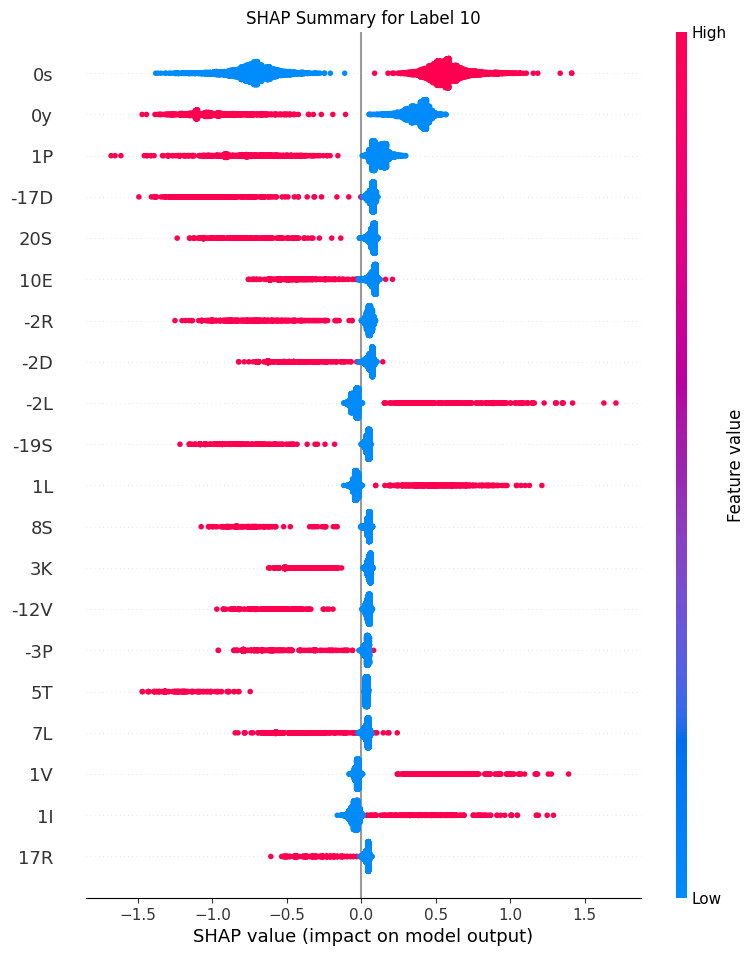

In [ ]:
shap.summary_plot(shap_values, X_test, show=False)
plt.title(f'SHAP Summary for Label {i}')
plt.show()

In [ ]:
import xgboost as xgb

# Initialize the classifier
model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False)

# Fit the model on multi-label data
model.fit(X_train, Y_train)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/xgboost/training.py:183: UserWarning: [01:33:06] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
for i, estimator in enumerate(model.estimators_):
    # Compute SHAP values for label i
    explainer = shap.Explainer(estimator, X_train)
    shap_values = explainer(X_test)

    # Visualize SHAP values for label i
    shap.plots.beeswarm(shap_values, max_display=10)
    if i ==10: break

AttributeError: 'XGBClassifier' object has no attribute 'estimators_'

In [ ]:
import shap

# Create a SHAP explainer
explainer = shap.Explainer(model, X_train)

# Compute SHAP values for the test set
shap_values = explainer(X_test)

ModuleNotFoundError: No module named 'shap'

In [ ]:
shap.summary_plot(shap_values, X_test)

In [ ]:
shap.dependence_plot("feature_name", shap_values.values, X_test)


In [ ]:
shap.force_plot(explainer.expected_value, shap_values.values[0], X_test[0])


In [ ]:
from sklearn.metrics import hamming_loss, accuracy_score, f1_score

# Predict on the test set
Y_pred = model.predict(X_test)

# Compute evaluation metrics
print("Hamming Loss:", hamming_loss(Y_test, Y_pred))
print("Subset Accuracy:", accuracy_score(Y_test, Y_pred))
print("F1 Score (Micro):", f1_score(Y_test, Y_pred, average='micro'))

In [ ]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:

base = KNeighborsClassifier(n_neighbors=5,n_jobs=-1)
# base = LogisticRegression(max_iter=1000)
clf = MultiOutputClassifier(base)
clf.fit(X_train, Y_train)

MultiOutputClassifier(estimator=KNeighborsClassifier(n_jobs=-1))

In [ ]:
Y_pred = clf.predict(X_test)
# Y_pred = clf.predict_proba(X_test)

In [ ]:
out = pd.DataFrame(Y_pred)

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix

In [ ]:
Y_pred

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
cm = multilabel_confusion_matrix(Y_test.values, Y_pred)

In [ ]:
import seaborn as sns

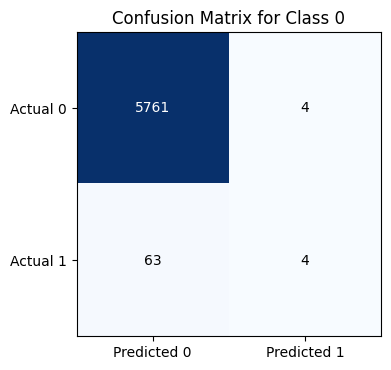

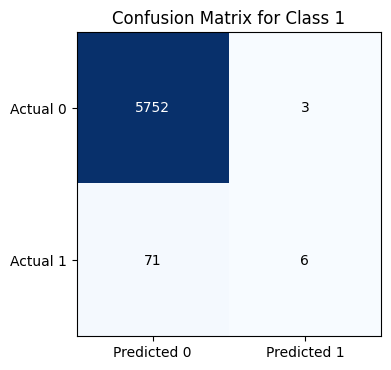

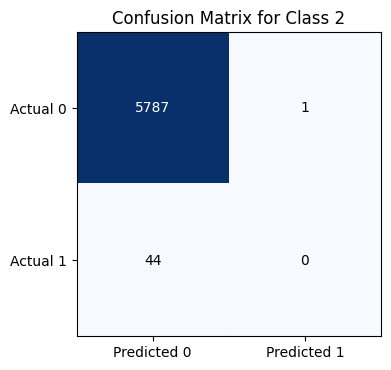

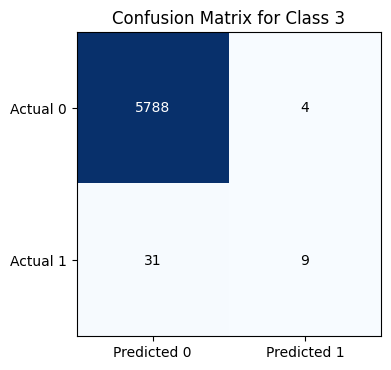

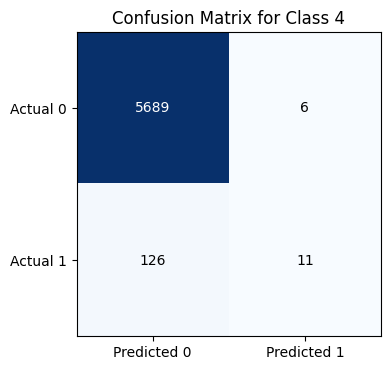

...

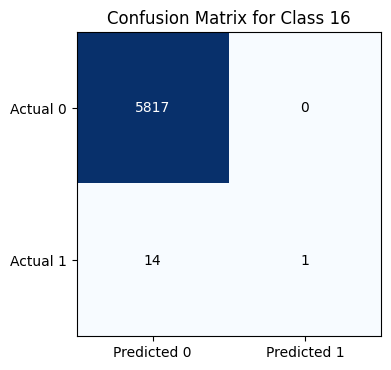

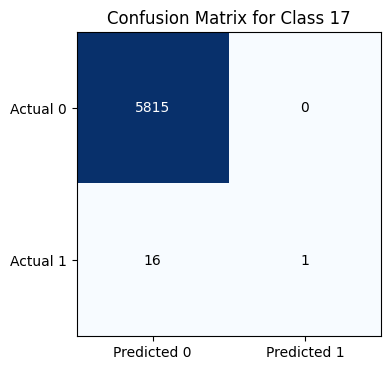

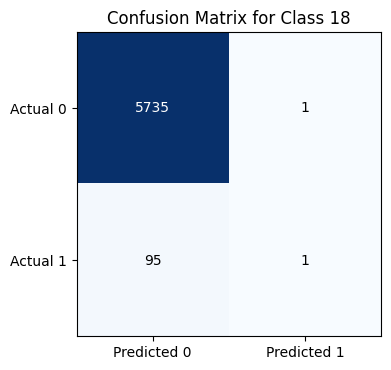

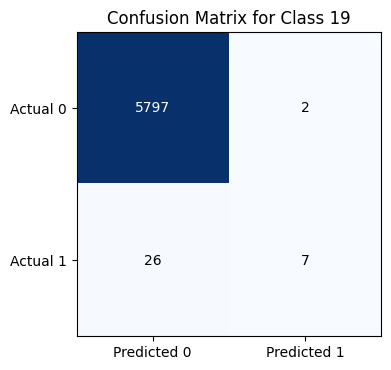

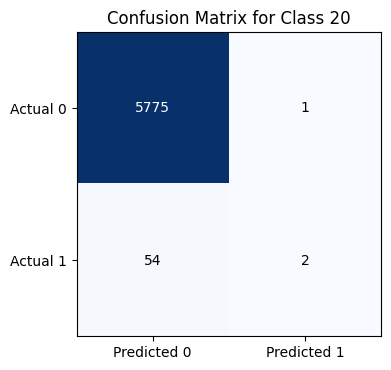

In [ ]:
for i in range(num_classes):
    plt.figure(figsize=(4, 4))
    c_matrix = cm[i]
    plt.imshow(c_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {class_names[i]}')
    plt.xticks([0, 1], ['Predicted 0', 'Predicted 1'])
    plt.yticks([0, 1], ['Actual 0', 'Actual 1'])

    for j in range(2):
        for k in range(2):
            plt.text(k, j, format(c_matrix[j, k], 'd'),
                     ha="center", va="center",
                     color="white" if c_matrix[j, k] > c_matrix.max() / 2. else "black")

    plt.tight_layout()
    plt.show()
    if i==20: break

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'cm' is your multilabel confusion matrix
num_classes = cm.shape[0]
class_names = [f'Class {i}' for i in range(num_classes)]  # Replace with actual class names if available

fig, axes = plt.subplots(nrows=1, ncols=num_classes, figsize=(5 * num_classes, 4))

for i in range(num_classes):
    ax = axes[i] if num_classes > 1 else axes
    c_matrix = cm[i]
    im = ax.imshow(c_matrix, interpolation='nearest', cmap=plt.cm.Blues)
    ax.set_title(f'Confusion Matrix for {class_names[i]}')
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.set_xticklabels(['Predicted 0', 'Predicted 1'])
    ax.set_yticklabels(['Actual 0', 'Actual 1'])

    # Loop over data dimensions and create text annotations.
    for j in range(2):
        for k in range(2):
            ax.text(k, j, format(c_matrix[j, k], 'd'),
                    ha="center", va="center",
                    color="white" if c_matrix[j, k] > c_matrix.max() / 2. else "black")
            break

plt.tight_layout()
plt.show()

ValueError: Image size of 160000x400 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 160000x400 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 160000x400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 160000x400 with 320 Axes>

In [ ]:
sns.heatmap(cm, annot=False)

ValueError: Must pass 2-d input. shape=(320, 2, 2)

In [ ]:

    
# Create a heatmap
plt.figure(figsize=(8+4, 6+4))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

,0,1,2,3,4,5,6,7,8,9,...,317,318,319,320,321,322,323,324,325,326
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5827,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5828,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5829,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5830,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

In [ ]:
mlb = MultiLabelBinarizer()
y = mlb.fit_transform(train['kinase_gene'])

# Save the list of kinase classes
kinase_classes = mlb.classes_

In [ ]:
len(kinase_classes)

452

## K-mer

In [ ]:

import umap
from collections import Counter
from sklearn.preprocessing import StandardScaler

In [ ]:
def extract_kmers(peptides, k):
    """Generate k-mer frequency feature vectors from a list of peptide sequences."""
    all_kmers = []
    feature_vectors = []

    # Collect all k-mers to create a global vocabulary
    for peptide in peptides:
        kmers = [peptide[i:i+k] for i in range(len(peptide) - k + 1)]
        all_kmers.extend(kmers)

    unique_kmers = list(set(all_kmers))  # Unique k-mers as features
    kmer_dict = {kmer: i for i, kmer in enumerate(unique_kmers)}

    # Generate feature vectors
    for peptide in peptides:
        kmers = [peptide[i:i+k] for i in range(len(peptide) - k + 1)]
        kmer_counts = Counter(kmers)
        vector = np.zeros(len(unique_kmers))

        for kmer, count in kmer_counts.items():
            vector[kmer_dict[kmer]] = count

        feature_vectors.append(vector)

    return np.array(feature_vectors), unique_kmers

In [ ]:
peptides = df[SEQ_COL].tolist()

In [ ]:
k = 1
feature_matrix, kmer_labels = extract_kmers(peptides, k)

# Normalize features
scaler = StandardScaler()
feature_matrix_scaled = scaler.fit_transform(feature_matrix)

In [ ]:
feature_matrix_scaled.columns=['kmer1_'+i for i in kmer_labels]

In [ ]:
feature_matrix_scaled.head()

,kmer1__,kmer1_W,kmer1_I,kmer1_H,kmer1_S,kmer1_L,kmer1_Q,kmer1_V,kmer1_t,kmer1_E,...,kmer1_R,kmer1_A,kmer1_M,kmer1_F,kmer1_y,kmer1_Y,kmer1_C,kmer1_P,kmer1_N,kmer1_T
0,-0.292368,-0.534618,-0.381885,0.185877,0.705791,1.538938,-1.153188,-1.372517,-0.827500,3.041615,...,-0.323779,1.174198,-0.811313,-1.005910,-0.722063,-0.628547,1.630311,-1.163877,-0.330899,-0.183614
1,-0.292368,-0.534618,0.350920,2.264674,-0.385998,0.475219,0.139184,-0.067668,1.667494,0.357542,...,-1.372446,-0.881089,-0.811313,0.732836,0.332195,-0.628547,1.630311,-0.291796,0.437719,0.611965
2,-0.292368,-0.534618,0.350920,2.264674,-0.931893,0.475219,-0.507002,-0.067668,1.667494,0.357542,...,-1.372446,-0.881089,-0.811313,0.732836,0.332195,0.515607,1.630311,0.144245,0.437719,0.611965
3,-0.292368,-0.534618,-0.381885,0.185877,-0.931893,-0.588501,-1.153188,1.237181,-0.827500,0.804887,...,-0.848113,0.660376,-0.811313,0.732836,-0.722063,-0.628547,-0.608818,1.016327,0.437719,0.611965
4,-0.292368,-0.534618,-0.381885,0.185877,-0.931893,-0.588501,-1.153188,1.237181,-0.827500,0.804887,...,-1.372446,1.174198,-0.811313,2.471583,-0.722063,0.515607,-0.608818,0.580286,-0.330899,0.611965


## One-hot encode

,x0_A,x0_C,x0_D,x0_E,x0_F,x0_G,x0_H,x0_I,x0_K,x0_L,...,x40_R,x40_S,x40_T,x40_V,x40_W,x40_Y,x40__,x40_s,x40_t,x40_y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29151,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29153,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# features= pd.concat([onehot,feature_matrix_scaled],axis=1)

Need to modify non-canonical

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
label_encoder = LabelEncoder()

labels =np.array(df['kinase_pspa_small'].fillna('Others'))
y = label_encoder.fit_transform(labels)

In [ ]:
onehot_encode(df['site_seq'])

,x0_A,x0_C,x0_D,x0_E,x0_F,x0_G,x0_H,x0_I,x0_K,x0_L,...,x40_R,x40_S,x40_T,x40_V,x40_W,x40_Y,x40__,x40_s,x40_t,x40_y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29151,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
29152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X = onehot_encode(train[SEQ_COL])

colname = X.columns.str[1:].tolist()
colname = [f"{int(item.split('_', 1)[0]) - 20}{item.split('_', 1)[1]}" for item in colname]

X.columns = colname
X.head()

,-20A,-20C,-20D,-20E,-20F,-20G,-20H,-20I,-20K,-20L,...,20R,20S,20T,20V,20W,20Y,20_,20s,20t,20y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def get_train_result_multilabel(X, y, label_names):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    model = OneVsRestClassifier(
        XGBClassifier(
            objective='binary:logistic',
            eval_metric='logloss',
            # use_label_encoder=False,
            tree_method='hist'
        )
    )
    
    print("Training multi-label model...")
    model.fit(X_train, y_train)
    
    print("Predicting...")
    y_pred = model.predict(X_test)

    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=label_names, zero_division=0))
    
    return model, (X_train, X_test, y_train, y_test, y_pred)

In [ ]:
model, data_split = get_train_result_multilabel(X, y, label_names=mlb.classes_)

Training multi-label model...


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../xgboost/training.py:183: UserWarning: [14:09:32] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../xgboost/training.py:183: UserWarning: [14:09:33] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../xgboost/training.py:183: UserWarning: [14:09:34] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../xgboost/training.py:183: UserWarning: [14:09:36] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" }

In [ ]:
def get_train_result(X,y):
    X=X.copy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y, random_state=42)
    num_classes=len(set(y))
    # Convert to XGBoost DMatrix format
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)
    
    # Set XGBoost parameters
    params = {
        'objective': 'multi:softmax',  # Multi-class classification
        'num_class': num_classes,
        'eval_metric': 'mlogloss',
        'max_depth': 6,
        'eta': 0.1,
        'tree_method': 'hist'
    }
        
    
    # Train model
    print('training')
    model = xgb.train(params, dtrain, num_boost_round=100)

    print('predict on test')
    # Evaluate accuracy
    y_pred = model.predict(dtest)
    y_pred = np.round(y_pred).astype(int)
    # accuracy = (y_pred == y_test).mean()

    
    fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size
    xgb.plot_importance(model, importance_type="weight", max_num_features=30, ax=ax)
    plt.title(f"Top {30} Most Important Features")
    plt.show()

    # Get detailed metrics
    report = classification_report(y_test, 
                                   y_pred, 
                                   target_names = label_encoder.classes_,
                                   digits=4, zero_division=0)
    print(report)
    
    
    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Create a heatmap
    plt.figure(figsize=(8+4, 6+4))
    sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    
    # plt.savefig('CM.png')
    plt.show()
    return model, (X_train, X_test, y_train, y_test,y_pred)

In [ ]:
# X=onehot.copy()

In [ ]:
model, data = get_train_result(X,y)

ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

training
predict on test


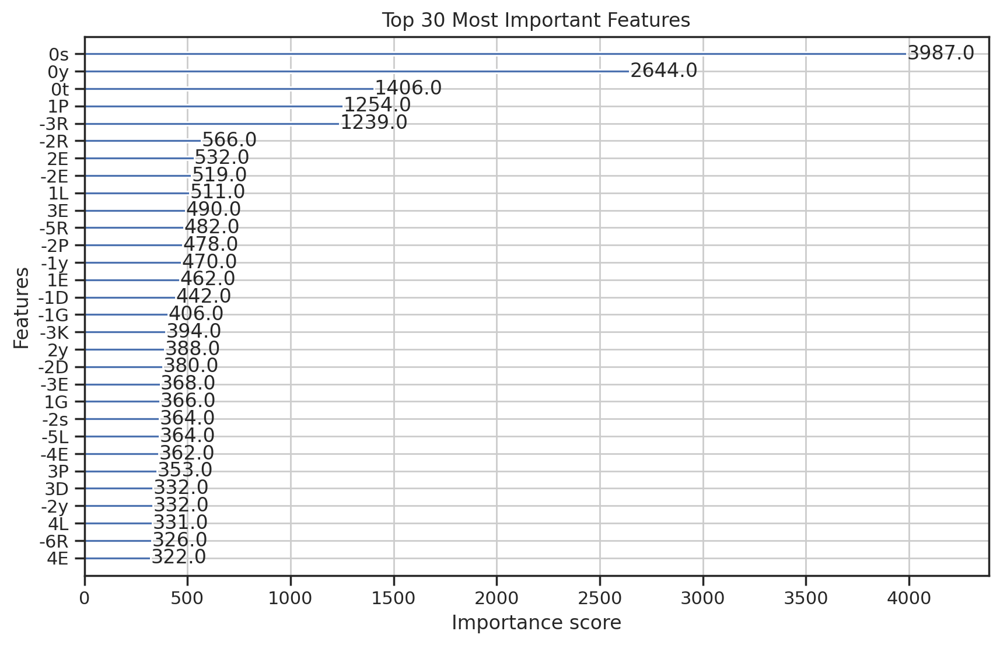

                                    precision    recall  f1-score   support

                               ABL     0.3103    0.1314    0.1846       137
                               ACK     0.6667    0.0833    0.1481        24
                          AKT/ROCK     0.3057    0.3105    0.3081       190
                         ALPHA/MLK     0.1493    0.0746    0.0995       134
                              AMPK     0.1818    0.0920    0.1221        87
                          AURK/PKA     0.3206    0.5437    0.4034       263
                             CAMK2     0.4000    0.0408    0.0741        49
                             CDK_I     0.5067    0.4824    0.4943       313
                            CDK_II     0.7778    0.1321    0.2258        53
                               CK1     0.2041    0.1923    0.1980       104
                               CK2     0.4405    0.5988    0.5076       167
                              CMGC     0.2500    0.0500    0.0833        40
           

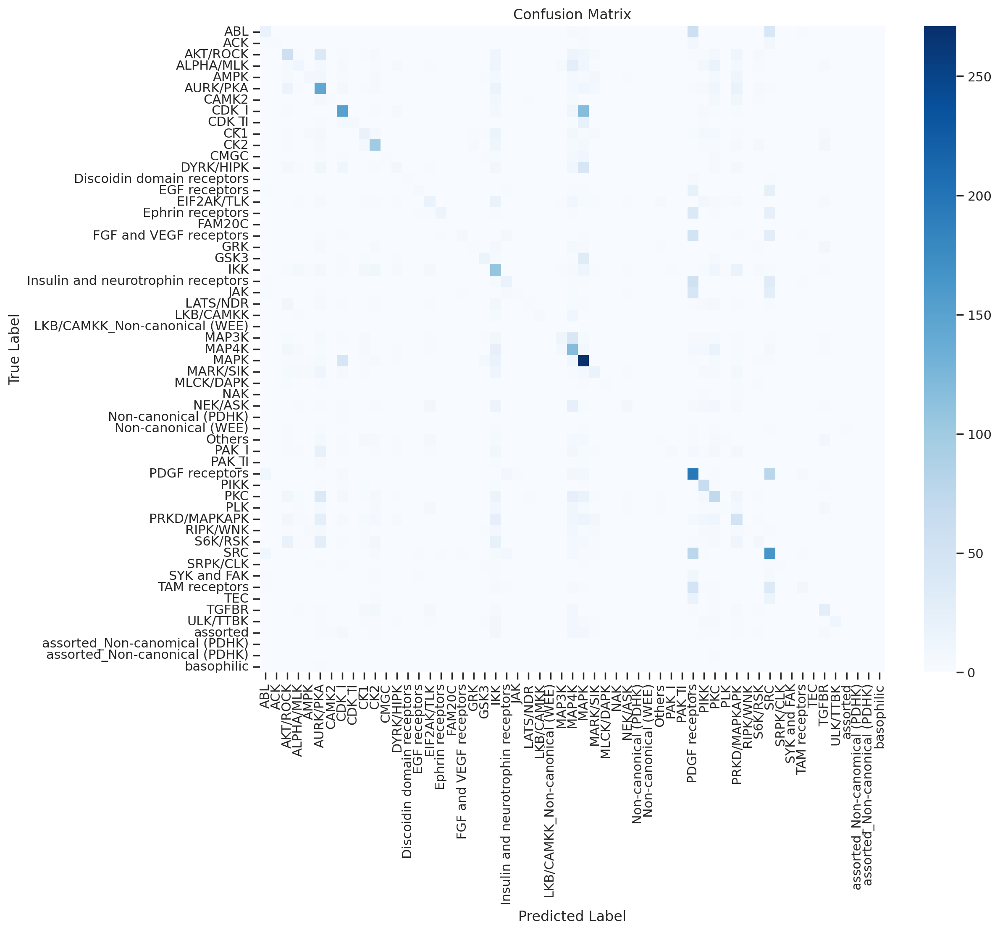

In [ ]:
model, data = get_train_result(X,y)

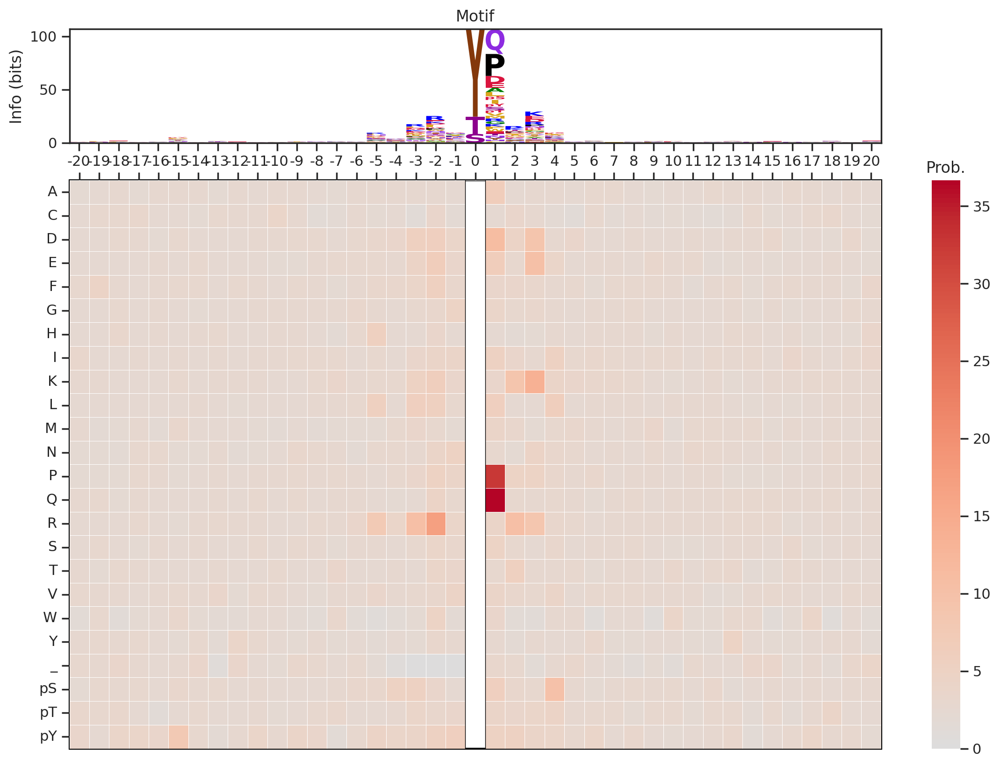

In [ ]:
gain_scores = model.get_score(importance_type='gain')

gain_pssm = recover_pssm(pd.Series(gain_scores))

plot_logo_heatmap(gain_pssm,figsize=(14,10),include_zero=False)

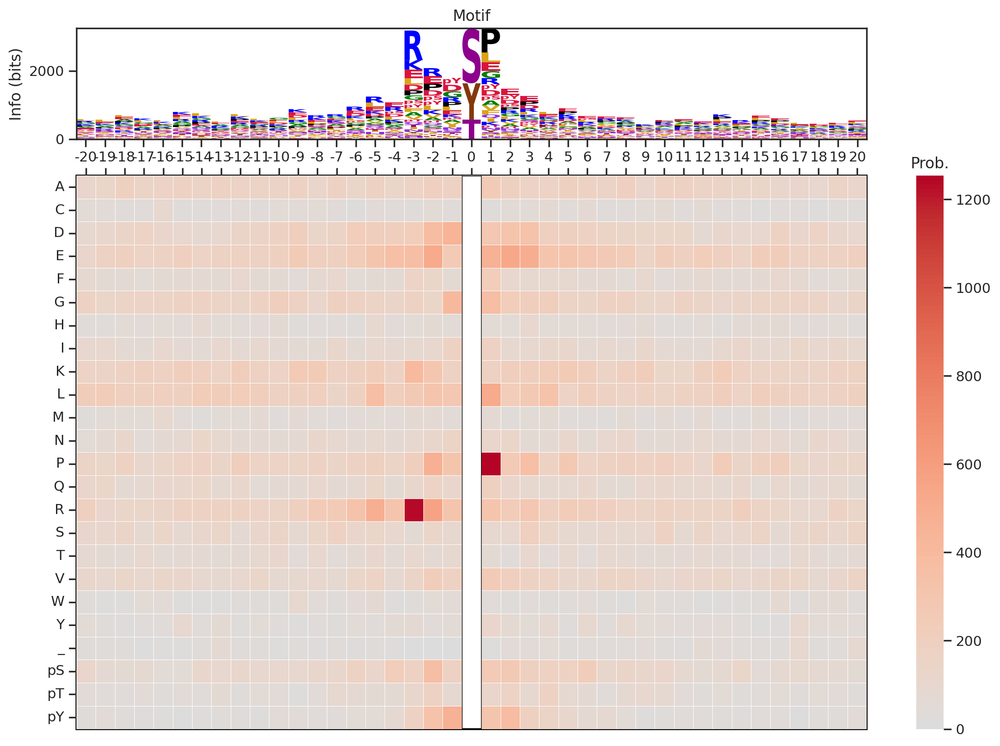

In [ ]:
weight_scores = model.get_score(importance_type='weight')

weight_pssm = recover_pssm(pd.Series(weight_scores))

plot_logo_heatmap(weight_pssm,figsize=(14,10),include_zero=False)

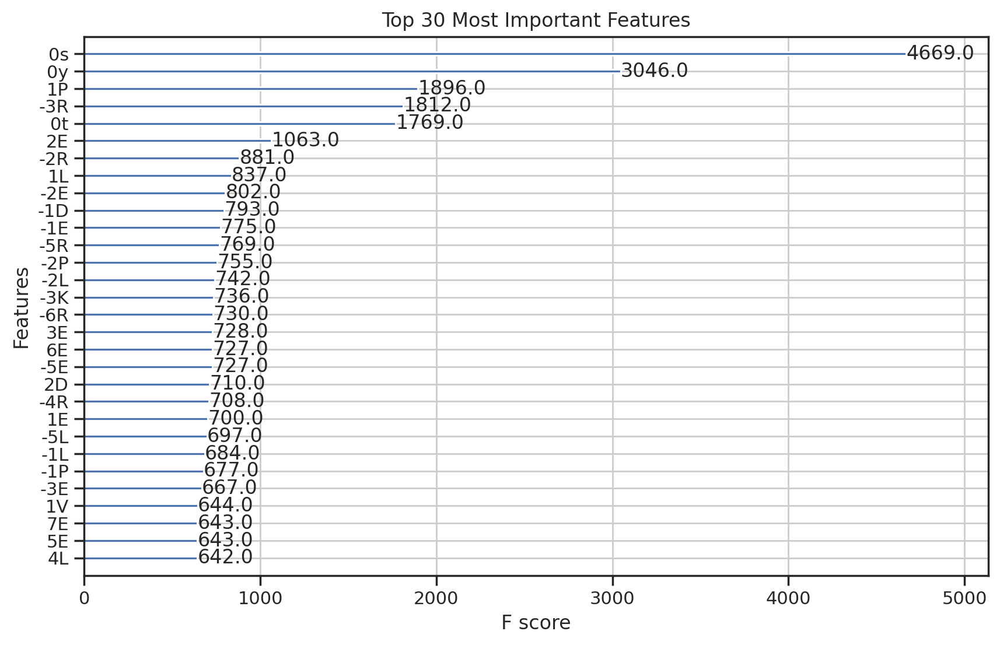

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size
xgb.plot_importance(model, importance_type="weight", max_num_features=30, ax=ax)
plt.title(f"Top {30} Most Important Features")
plt.show()

In [ ]:
from sklearn.metrics import classification_report

In [ ]:


# Get detailed metrics
report = classification_report(y_test, 
                               y_pred, 
                               target_names = label_encoder.classes_,
                               digits=4, zero_division=0)
print(report)


In [ ]:
print(report)

                                    precision    recall  f1-score   support

                               ABL     0.2656    0.5770    0.3638       331
                               ACK     0.2273    0.1087    0.1471        46
                          AKT/ROCK     0.3539    0.3500    0.3520       180
                         ALPHA/MLK     0.1481    0.0984    0.1182       122
                              AMPK     0.2113    0.1442    0.1714       104
                          AURK/PKA     0.3537    0.6268    0.4522       351
                             CAMK2     0.1552    0.0789    0.1047       114
                             CDK_I     0.4790    0.5245    0.5007       326
                            CDK_II     1.0000    0.0192    0.0377        52
                               CK1     0.1905    0.2286    0.2078       140
                               CK2     0.3952    0.6117    0.4802       188
                              CMGC     0.1818    0.0417    0.0678        48
           

In [ ]:
accuracy

0.2899331049110785

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import xgboost as xgb
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [ ]:


# Convert test data to DMatrix format
dtest = xgb.DMatrix(X_test)

# Predict class labels
y_pred = model.predict(dtest)

# Convert predictions to integers (if not already)
y_pred = np.round(y_pred).astype(int)




# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)




# Create a heatmap
plt.figure(figsize=(8+4, 6+4))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

plt.savefig('CM.png')
plt.show()

In [ ]:
# pip install shap

In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(model)

In [ ]:
shap_values = explainer(X_test)

In [ ]:
shap.initjs()

In [ ]:
# Create SHAP explainer



  1%|                   | 2817/349353 [04:08<508:27]       

In [ ]:
shap.summary_plot(shap_values, X_test, feature_names=X.columns.tolist())

In [ ]:
y_pred

array([ 7.,  0., 10., ..., 45., 10., 28.], dtype=float32)

In [ ]:
accuracy

0.2935225974873552

In [ ]:
pspa_small

kinase
AAK1              NAK
ABL1              ABL
ABL2              ABL
TNK2              ACK
ACVR2A          TGFBR
             ...     
YSK1            MAP4K
ZAK             MAP3K
ZAP70     SYK and FAK
EEF2K       ALPHA/MLK
FAM20C         FAM20C
Name: pspa_category_small, Length: 522, dtype: object

In [ ]:
from fastcore.utils import L

In [ ]:
onehot

,-7A,-7C,-7D,-7E,-7F,-7G,-7H,-7I,-7K,-7L,-7M,-7N,-7P,-7Q,-7R,-7S,-7T,-7V,-7W,-7Y,-7_,-7s,-7t,-7y,-6A,-6C,-6D,-6E,-6F,-6G,-6H,-6I,-6K,-6L,-6M,-6N,-6P,-6Q,-6R,-6S,-6T,-6V,-6W,-6Y,-6_,-6s,-6t,-6y,-5A,-5C,-5D,-5E,-5F,-5G,-5H,-5I,-5K,-5L,-5M,-5N,-5P,-5Q,-5R,-5S,-5T,-5V,-5W,-5Y,-5_,-5s,-5t,-5y,-4A,-4C,-4D,-4E,-4F,-4G,-4H,-4I,-4K,-4L,-4M,-4N,-4P,-4Q,-4R,-4S,-4T,-4V,-4W,-4Y,-4_,-4s,-4t,-4y,-3A,-3C,-3D,-3E,-3F,-3G,-3H,-3I,-3K,-3L,-3M,-3N,-3P,-3Q,-3R,-3S,-3T,-3V,-3W,-3Y,-3_,-3s,-3t,-3y,-2A,-2C,-2D,-2E,-2F,-2G,-2H,-2I,-2K,-2L,-2M,-2N,-2P,-2Q,-2R,-2S,-2T,-2V,-2W,-2Y,-2_,-2s,-2t,-2y,-1A,-1C,-1D,-1E,-1F,-1G,-1H,-1I,-1K,-1L,-1M,-1N,-1P,-1Q,-1R,-1S,-1T,-1V,-1W,-1Y,-1_,-1s,-1t,-1y,0s,0t,0y,1A,1C,1D,1E,1F,1G,1H,1I,1K,1L,1M,1N,1P,1Q,1R,1S,1T,1V,1W,1Y,1_,1s,1t,1y,2A,2C,2D,2E,2F,2G,2H,2I,2K,2L,2M,2N,2P,2Q,2R,2S,2T,2V,2W,2Y,2_,2s,2t,2y,3A,3C,3D,3E,3F,3G,3H,3I,3K,3L,3M,3N,3P,3Q,3R,3S,3T,3V,3W,3Y,3_,3s,3t,3y,4A,4C,4D,4E,4F,4G,4H,4I,4K,4L,4M,4N,4P,4Q,4R,4S,4T,4V,4W,4Y,4_,4s,4t,4y,5A,5C,5D,5E,5F,5G,5H,5I,5K,5L,5M,5N,5P,5Q,5R,5S,5T,5V,5W,5Y,5_,5s,5t,5y,6A,6C,6D,6E,6F,6G,6H,6I,6K,6L,6M,6N,6P,6Q,6R,6S,6T,6V,6W,6Y,6_,6s,6t,6y,7A,7C,7D,7E,7F,7G,7H,7I,7K,7L,7M,7N,7P,7Q,7R,7S,7T,7V,7W,7Y,7_,7s,7t,7y
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [ ]:
# import seaborn as sns

# group_colors = {
#     'AG': '#037f04',
#     'DEsty': '#da143e',
#     'F': '#84380b',
#     'HQN': '#8d2be1',
#     'LMIFWTVC': '#d9a41c',
#     'P': '#000000',
#     'RK': '#0000ff',
#     'ST': '#8d008d',
#     'Y': '#84380b',
#     '_': 'yellow'
# }

# aa_color_map = {}
# for group, base_color in group_colors.items():
#     # Create a light palette (from base_color to white) with as many colors as letters in the group
#     palette = sns.light_palette(base_color, n_colors=8, input="hex",reverse=True)
#     # Assign each letter in the group a progressively lighter color
#     for i, aa in enumerate(sorted(group)):
#         aa_color_map[aa] = palette[i]

In [ ]:
# df = Data.get_ks_dataset()

In [ ]:
tab20bc = sns.color_palette("tab20", 20) + [sns.color_palette("tab20b", 20)[::4][i] for i in [0,1,3,4]]

In [ ]:
sns.color_palette("tab20c", 10)

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157)]

In [ ]:
sns.color_palette("tab20c", 25)

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157),
 (0.6313725490196078, 0.8509803921568627, 0.6078431372549019),
 (0.7803921568627451, 0.9137254901960784, 0.7529411764705882),
 (0.4588235294117647, 0.4196078431372549, 0.6941176470588235),
 (0.6196078431372549, 0.6039215686274509, 0.7843137254901961),
 (0.7372549019607844, 0.7411764705882353, 0.8627450980392157),
 (0.8549019607843137, 0.8549019607843137, 0.9215686274509803),
 (0.38823529411764707, 0.38823529411764707, 0.38823529411764707),
 (0.5882352941176471, 0.5882352941176471, 0.5882352941176471),
 (0.7411764705882353, 0.7411764705882353, 0.7411764705882353),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627),
 (0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744)]

In [ ]:
import seaborn as sns
def plot_2d(X: pd.DataFrame, # a dataframe that has first column to be x, and second column to be y
            **kwargs, # arguments for sns.scatterplot
            ):
    "Make 2D plot from a dataframe that has first column to be x, and second column to be y"
    plt.figure(figsize=(7,7))
    sns.scatterplot(data = X,x=X.columns[0],y=X.columns[1],alpha=0.7,**kwargs)

def plot_2d_style(embed,no_frame=False, **kwargs):
    plot_2d(embed,**kwargs)
    plt.legend(frameon=False,markerscale=8, bbox_to_anchor=(1, 1), loc='upper left')
    plt.tick_params(axis='both', which='both', length=0)
    if no_frame:
        ax = plt.gca()
        ax.set_frame_on(False)
        plt.xlabel('')
        plt.ylabel('')
    plt.xticks([])
    plt.yticks([])

In [ ]:
pca_embed=reduce_feature(onehot,'pca',n=50,seed=None)
onhot_embed=reduce_feature(pca_embed,'umap',complexity=15,seed=None)

In [ ]:
len(onehot)

29156

In [ ]:
onhot_embed=reduce_feature(onehot,'umap',complexity=15,seed=None)

In [ ]:
# pca_embed_onehot=reduce_feature(onehot,'pca',n=100,seed=None)
# pca_embed_kmer = reduce_feature(feature_matrix_scaled,'pca',n=5,seed=None)

# pca_embed=pd.concat([pca_embed_onehot,pca_embed_kmer],axis=1)

onhot_embed=reduce_feature(pca_embed_onehot,'umap',complexity=15,seed=None)

In [ ]:
umap_model = umap.UMAP(metric='dice', random_state=42)

# Fit and transform the data
embedding = umap_model.fit_transform(onehot)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../umap/umap_.py:1887: UserWarning: gradient function is not yet implemented for dice distance metric; inverse_transform will be unavailable
  warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
onhot_embed = pd.DataFrame(embedding)

In [ ]:
pca_embed=reduce_feature(features,'pca',n=50,seed=None)

In [ ]:
onhot_embed=reduce_feature(pca_embed,'umap',complexity=15,seed=None)

In [ ]:
import prince

In [ ]:
mca = prince.MCA(
    n_components=2,
    n_iter=3,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42,
    one_hot=False
)
mca = mca.fit_transform(onehot)

In [ ]:
mca

,0,1
0,-0.099896,-0.122510
1,-0.109294,-0.122680
2,-0.091015,-0.120340
3,-0.097323,-0.133918
4,-0.110189,-0.111004
...,...,...
29151,-0.094846,-0.117303
29152,-0.094179,-0.077234
29153,-0.109504,-0.115057
29154,-0.101956,-0.130661


In [ ]:
import altair as alt
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [ ]:
mca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.334,1.49%,1.49%
1,0.292,1.30%,2.79%


In [ ]:
center=len(df[SEQ_COL].iloc[0])//2

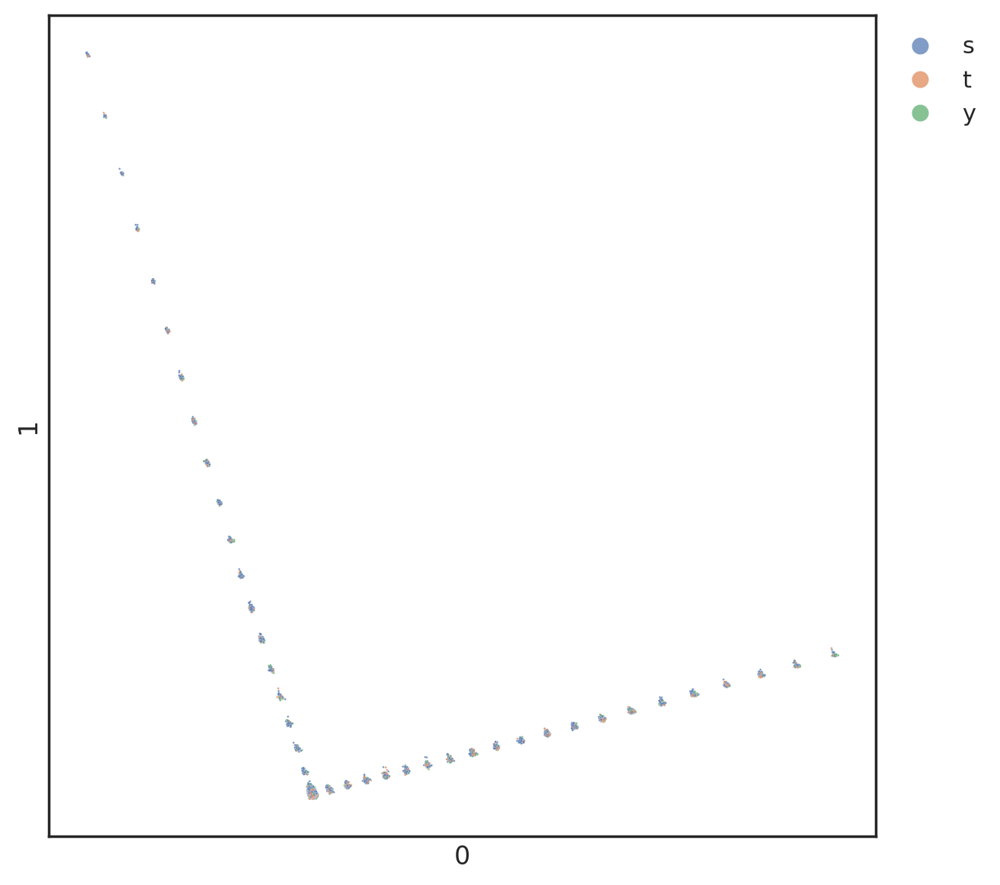

In [ ]:
plot_2d_style(mca,s=1,hue=df[SEQ_COL].str[center])

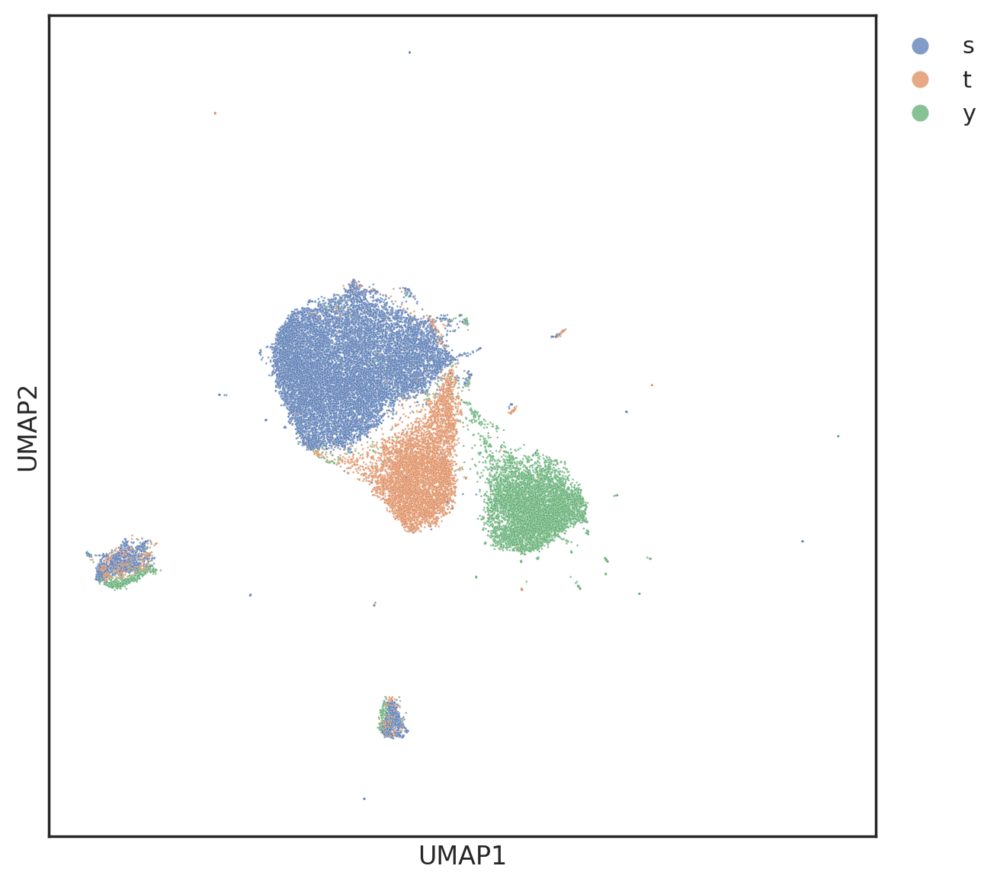

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[center])

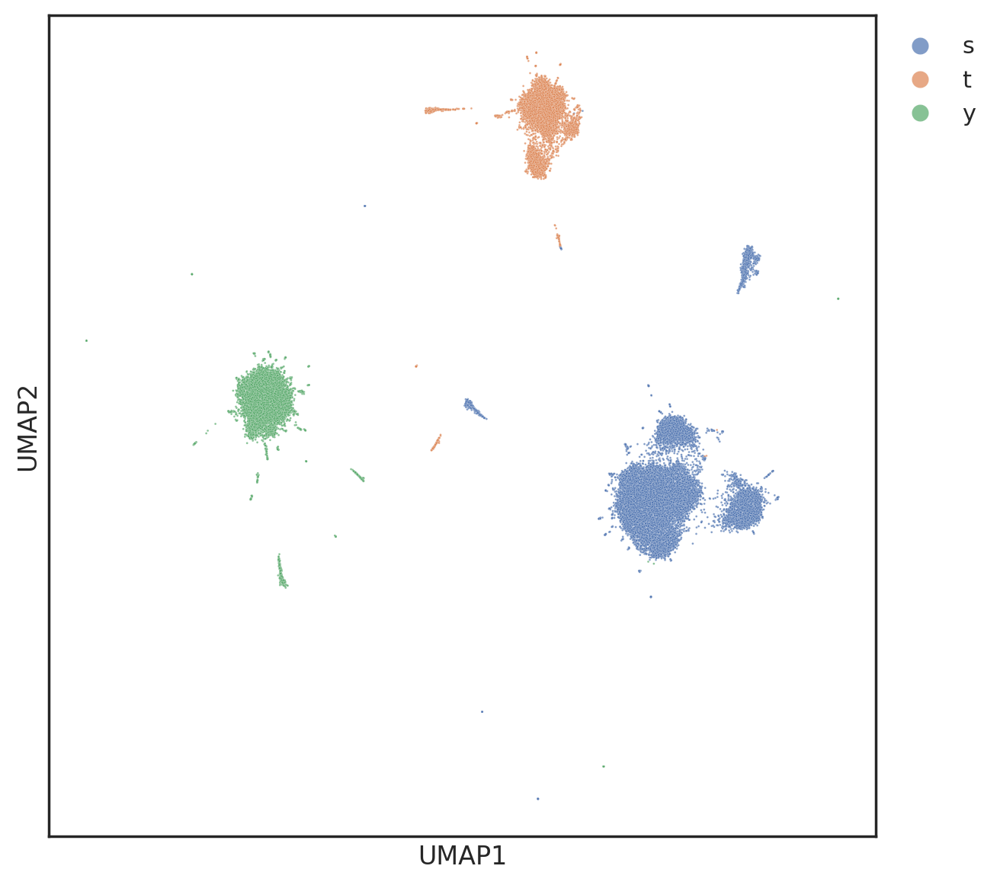

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[center])

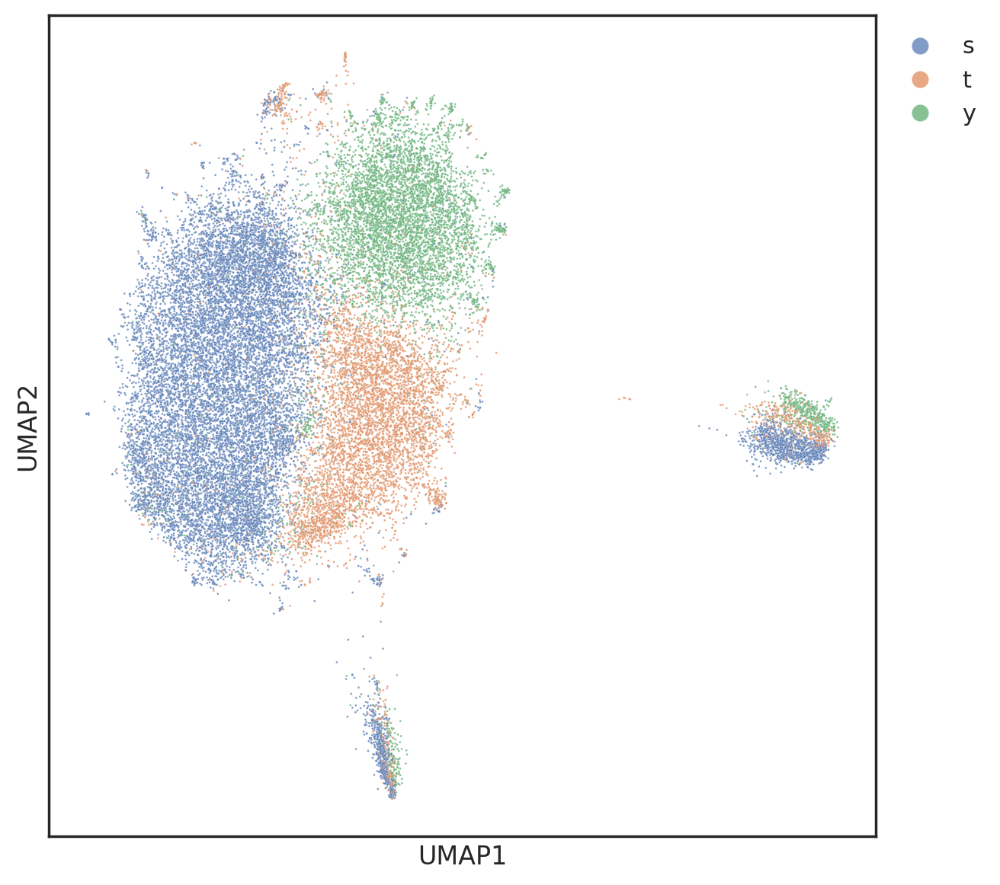

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[center])

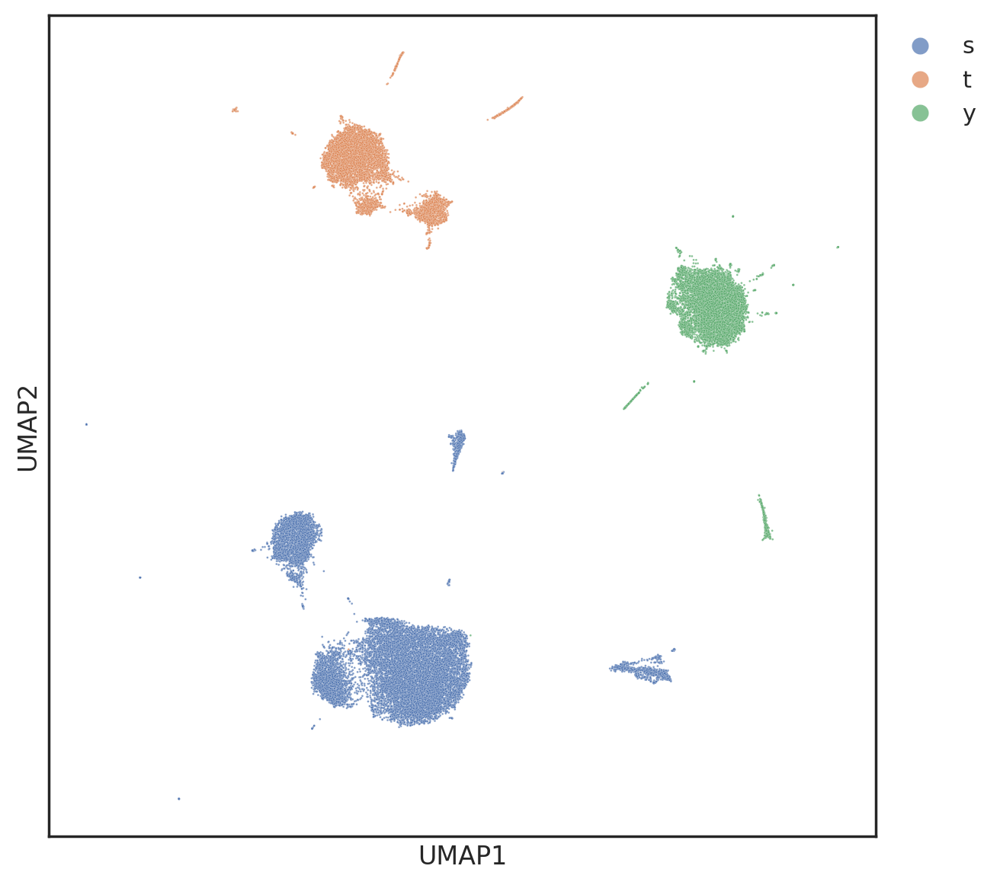

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[center])

In [ ]:
hue_order=list('PGACSTVILMFYWHKRQNDEsty_')

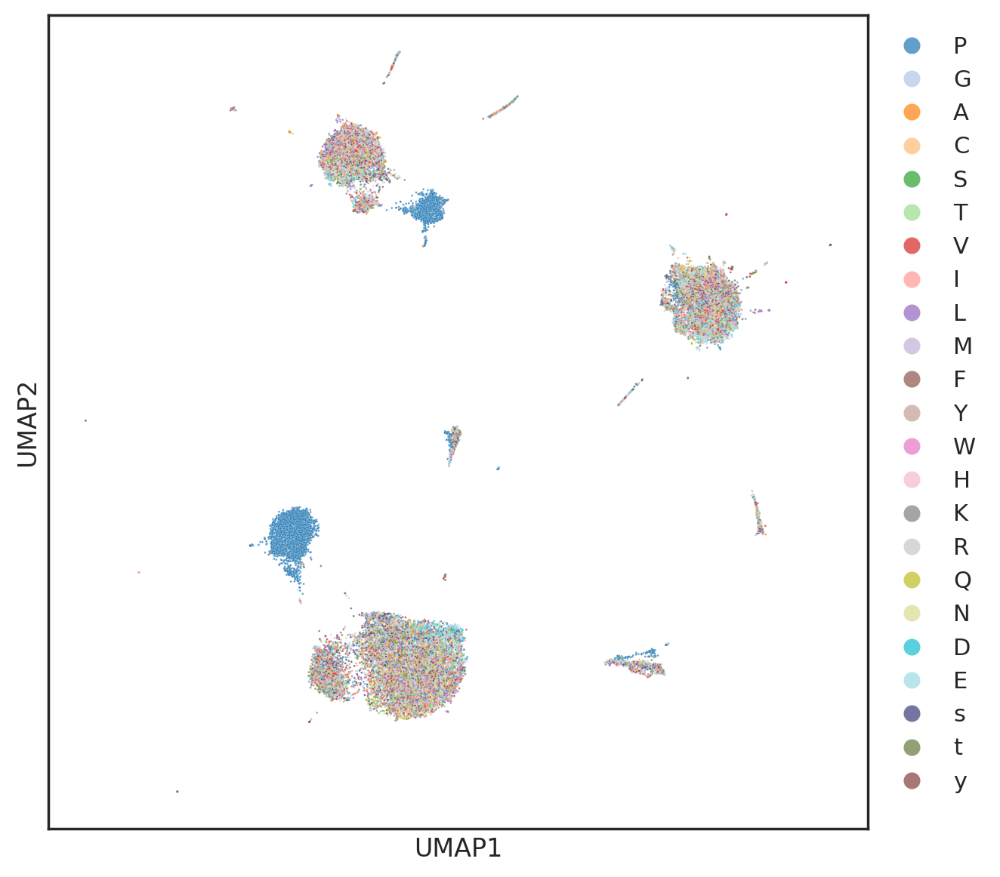

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[center+1],palette=tab20bc,hue_order=hue_order)

In [ ]:
group_hue = df.kinase_group.fillna('Other')

/tmp/ipykernel_33835/2654063392.py:7: UserWarning: The palette list has more values (24) than needed (9), which may not be intended.
  sns.scatterplot(data = X,x=X.columns[0],y=X.columns[1],alpha=0.7,**kwargs)


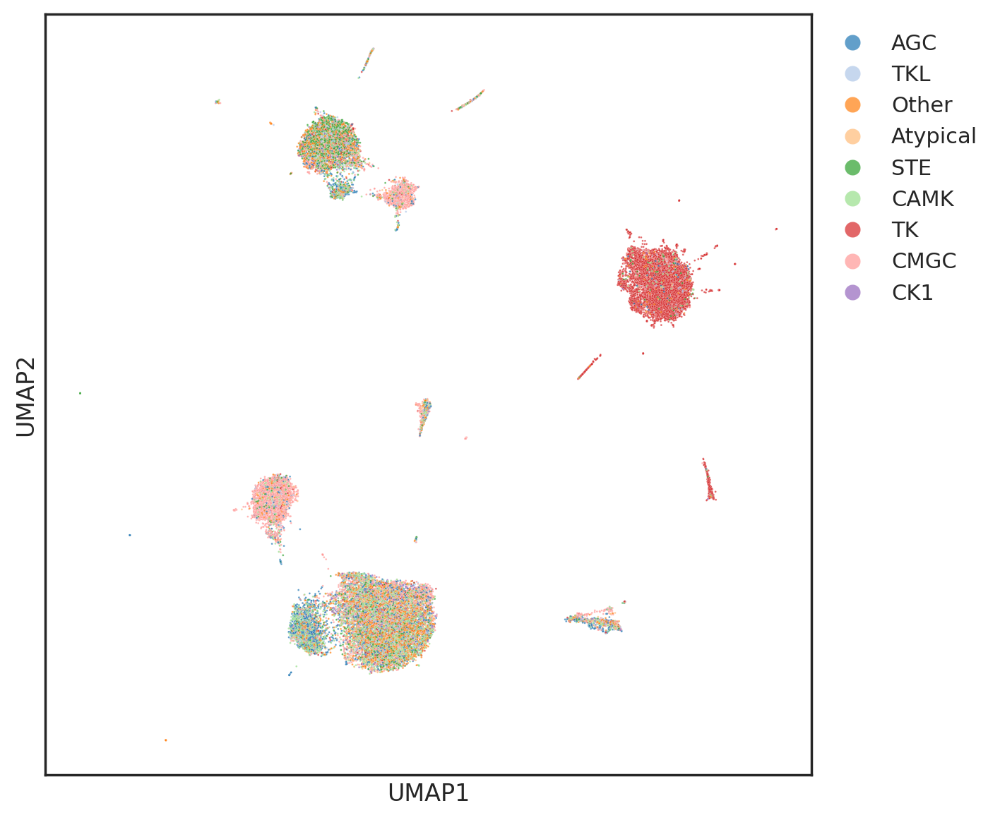

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=group_hue,palette=tab20bc)

In [ ]:
group_hue = df.kinase_paper.map(group).fillna('Other')

In [ ]:
hue_order=list('PGACSTVILMFYWHKRQNDEsty_')

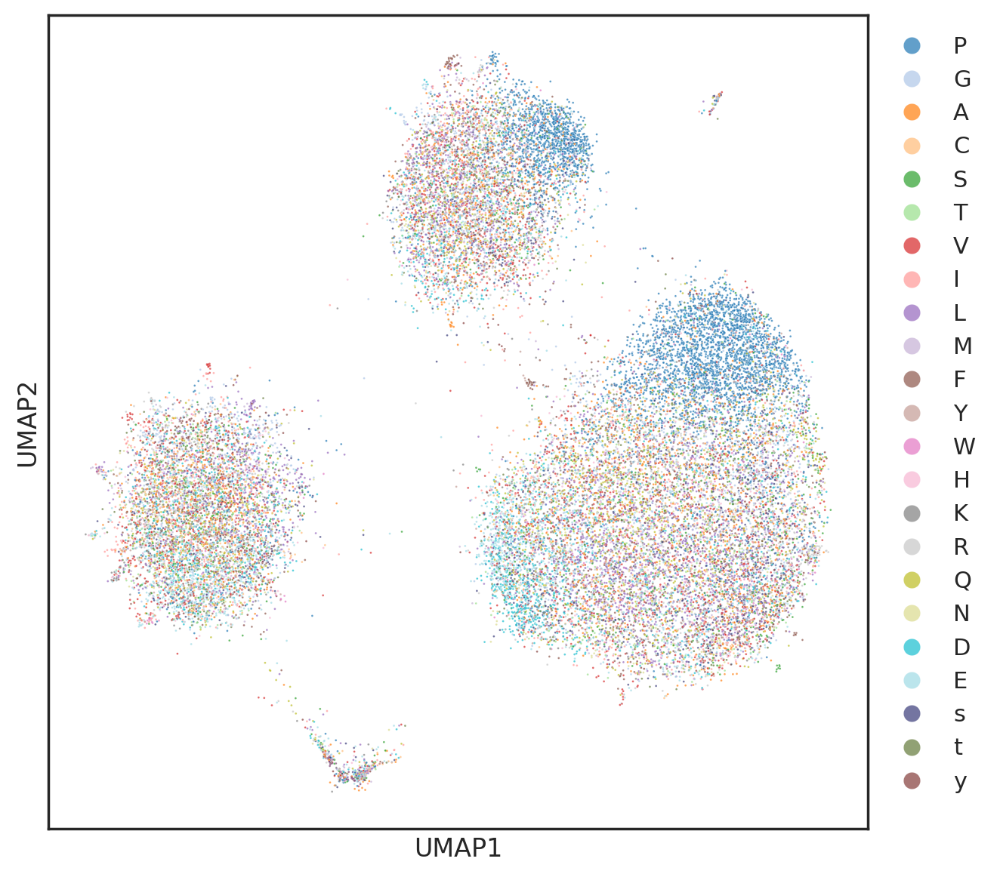

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=df[SEQ_COL].str[8],palette=tab20bc,hue_order=hue_order)

/tmp/ipykernel_7561/2523523824.py:7: UserWarning: The palette list has more values (24) than needed (9), which may not be intended.
  sns.scatterplot(data = X,x=X.columns[0],y=X.columns[1],alpha=0.7,**kwargs)


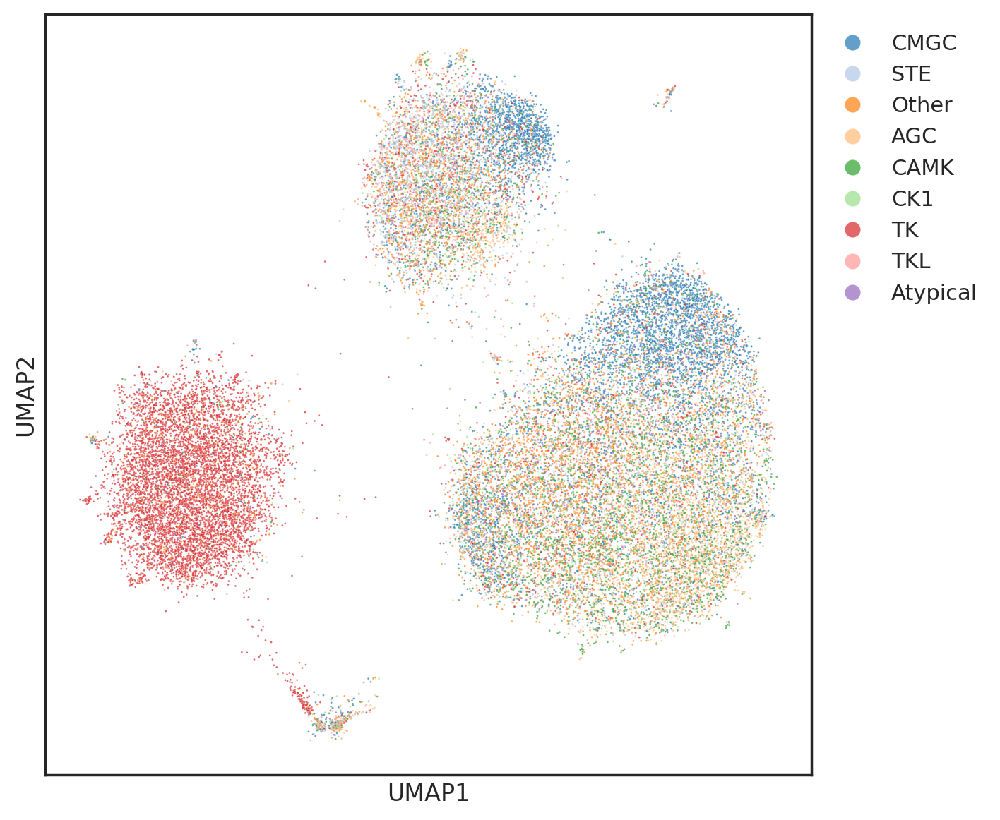

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=group_hue,palette=tab20bc)

In [ ]:
Qlabel=(df[SEQ_COL].str[8]=='Q').replace({True:'1Q',False:'others'})

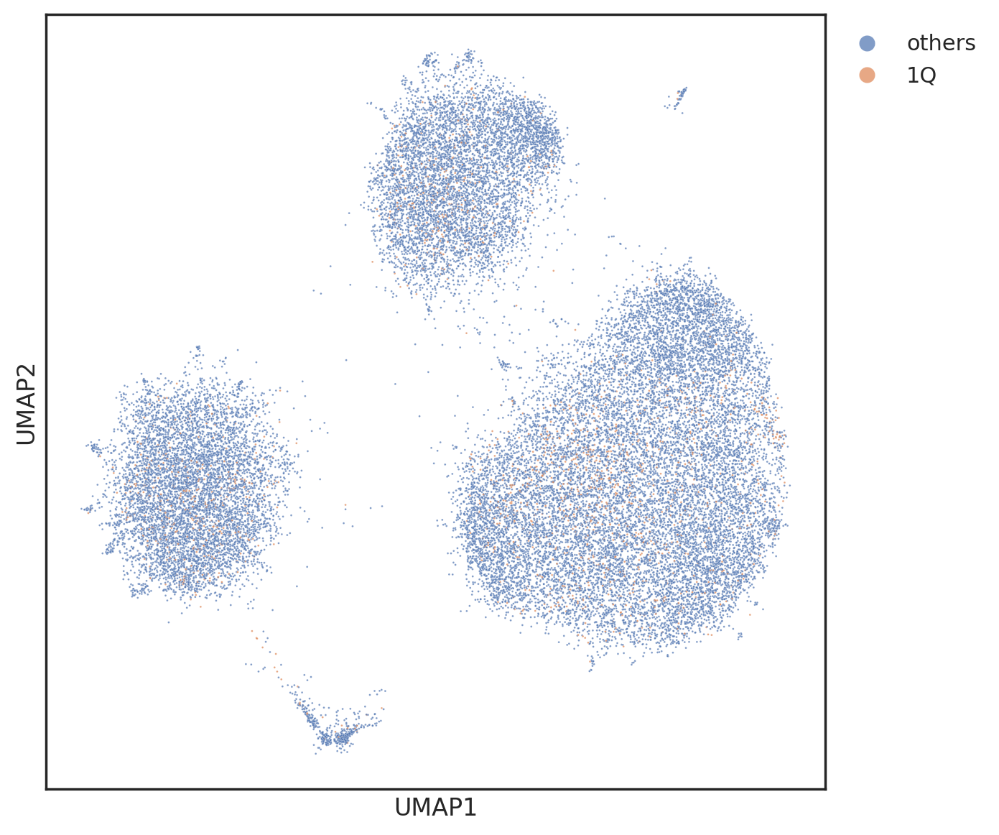

In [ ]:
plot_2d_style(onhot_embed,s=1,hue=Qlabel)

Not very much separation

## Physicochemical encoded

In [ ]:
aa = Data.get_aa_info().iloc[:-2,:]

In [ ]:
feat = get_rdkit_df(aa,'SMILES')

removing columns: {'MaxEStateIndex', 'SlogP_VSA7', 'fr_N_O', 'fr_lactone', 'NumSaturatedHeterocycles', 'Chi2v', 'MaxPartialCharge', 'fr_dihydropyridine', 'SMR_VSA8', 'NumAmideBonds', 'fr_COO2', 'fr_pyridine', 'Chi0', 'fr_term_acetylene', 'fr_halogen', 'EState_VSA11', 'SlogP_VSA9', 'fr_isothiocyan', 'fr_nitrile', 'fr_Ar_COO', 'fr_alkyl_halide', 'fr_oxazole', 'fr_imidazole', 'fr_nitro', 'fr_prisulfonamd', 'ExactMolWt', 'NumRadicalElectrons', 'fr_Ndealkylation1', 'fr_priamide', 'SMR_VSA2', 'PEOE_VSA13', 'fr_Nhpyrrole', 'NumValenceElectrons', 'fr_benzene', 'fr_Ar_OH', 'fr_Imine', 'fr_Ar_NH', 'fr_para_hydroxylation', 'fr_allylic_oxid', 'fr_ester', 'VSA_EState1', 'fr_methoxy', 'Chi2n', 'fr_ketone', 'fr_aldehyde', 'fr_lactam', 'fr_benzodiazepine', 'fr_phos_acid', 'NumBridgeheadAtoms', 'SlogP_VSA12', 'fr_hdrzone', 'fr_urea', 'fr_ArN', 'NumAliphaticRings', 'BCUT2D_MRHI', 'fr_COO', 'fr_thiazole', 'fr_ether', 'fr_Al_OH_noTert', 'PEOE_VSA5', 'NumSaturatedRings', 'fr_Ndealkylation2', 'fr_amidine', 

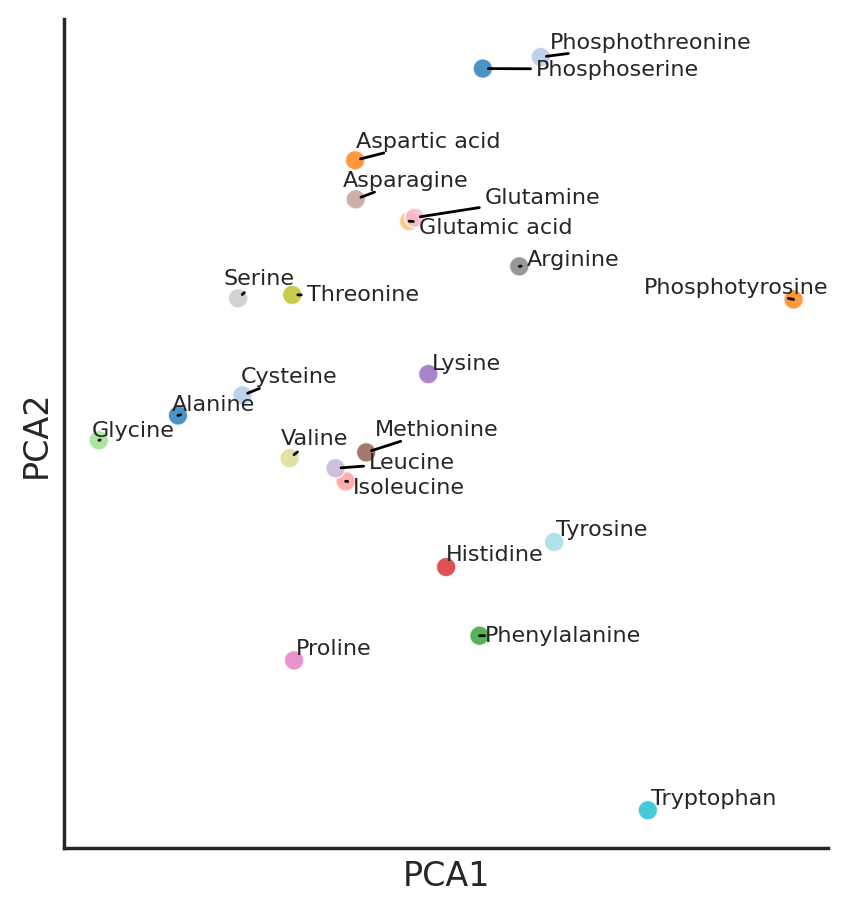

In [ ]:
plot_cluster(feat, name_list = aa.Name.tolist(), hue = 'aa', method = 'pca')

In [ ]:
dist_df,sim_df = get_similarity(feat)

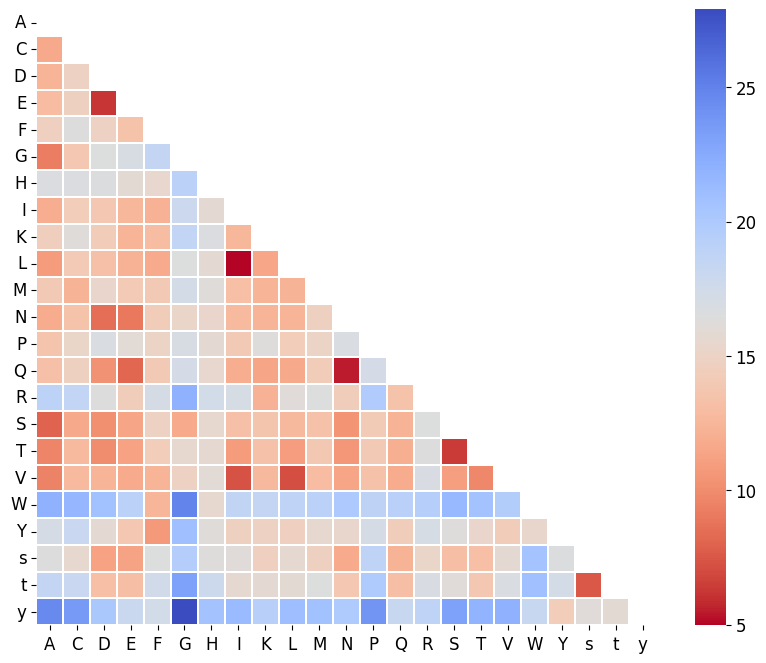

In [ ]:
plot_matrix(dist_df,inverse_color=True)

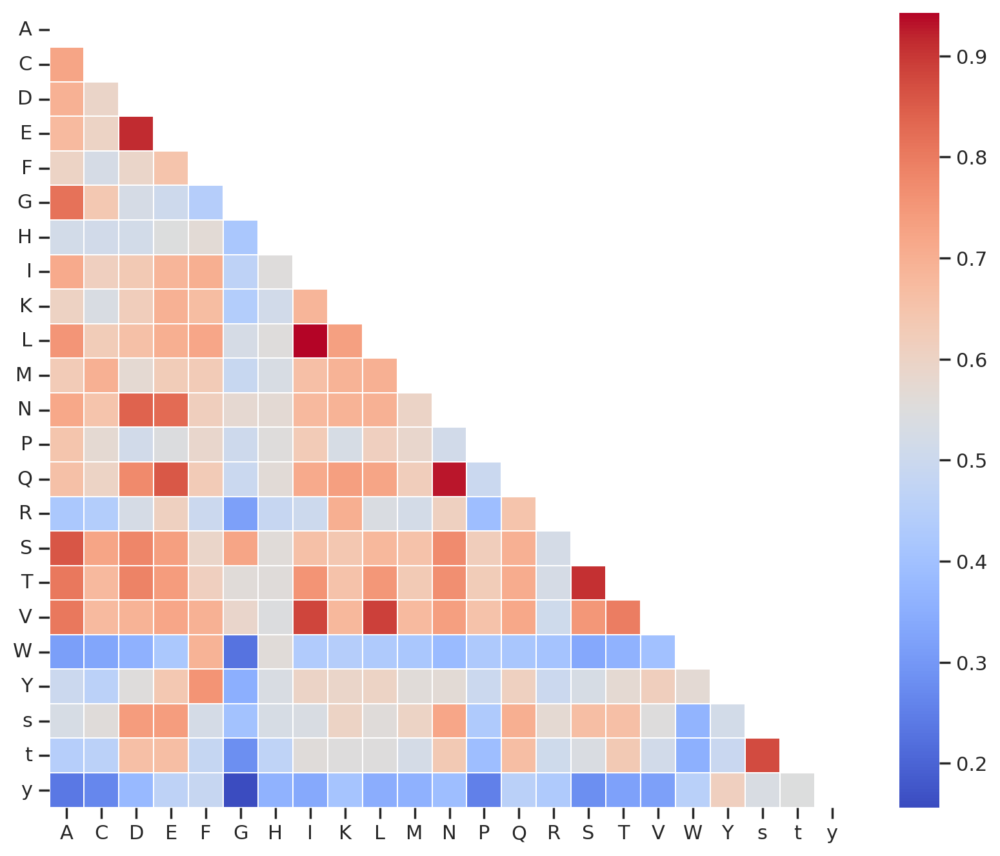

In [ ]:
plot_matrix(sim_df)

In [ ]:
feat.shape

(23, 116)

In [ ]:
def encode_seq(seq, encoder):
    vec = []
    feature_length = len(encoder.iloc[0])  # Get the length of feature vectors

    for aa in seq:
        if aa.upper() in encoder.index:
            vec.extend(encoder.loc[aa.upper()].tolist())
        else:
            vec.extend([0] * feature_length)  # Append zeros if AA is missing
    return vec

In [ ]:
check_seq_df(df, SEQ_COL)

0        AEGLRPAsPLGLTQE
1        GGGAGPVsPQHHELT
2        LRGNVVPsPLPtRRt
3        GPMRRSKsPADSANG
4        PERsQEEsPPGSTKR
              ...       
30639    GGGEGNVsQVGRVWP
30640    SSYRALIsAFSRLTR
30641    MDRSKRNsIAGFPPR
30642    FKVRHRAsGQVMALK
30643    YEKDGDEsSPILTsF
Name: substrate, Length: 30644, dtype: object

In [ ]:
encoded = df['substrate'].progress_apply(lambda x: encode_seq(x,feat))

  0%|          | 0/30644 [00:00<?, ?it/s]

In [ ]:
encoded = encoded.apply(pd.Series)

In [ ]:
get_train_result(encoded)

training
predict on test


NameError: name 'plt' is not defined

In [ ]:
encoded

0         1         2         3         4         5         6     \
0     -1.573701  1.193554  0.430590 -0.375462 -0.086117 -1.439770  0.228166   
1     -2.659736 -0.303815  0.426781 -0.653267 -1.825779 -1.787914  0.192416   
2      0.183853 -0.040705  0.471495  0.845016 -0.055272 -0.395340  0.229561   
3     -2.659736 -0.303815  0.426781 -0.653267 -1.825779 -1.787914  0.192416   
4      0.280001 -0.334373  0.630545  0.055833  3.962299 -0.793519  0.230539   
...         ...       ...       ...       ...       ...       ...       ...   
30639 -2.659736 -0.303815  0.426781 -0.653267 -1.825779 -1.787914  0.192416   
30640 -1.339938  0.444870  0.253486 -0.901151 -0.152214 -1.042683  0.241000   
30641  0.056275  0.601482  0.471762  0.965126 -0.240342  0.052405  0.229605   
30642  1.065996  0.050359  0.433525  1.825444 -0.433124  0.448946  0.231079   
30643  1.123589 -0.692988  0.383419  1.247929 -0.442022  0.846034 -4.682939   

           7         8         9         10        11        12        13    \
0     -0.308911  1.656688  0.103007 -0.780051 -0.526903  1.203883 -1.415519   
1     -0.289431  1.656688  0.268215 -0.661636 -0.527120  3.378062 -3.610682   
2     -0.309671  0.042430 -0.172341 -0.582692 -0.526883 -0.970017  0.047138   
3     -0.289431  1.656688  0.268215 -0.661636 -0.527120  3.378062 -3.610682   
4     -0.310204  0.445994  1.755094  1.292222 -0.526815  0.156428  1.016748   
...         ...       ...       ...       ...       ...       ...       ...   
30639 -0.289431  1.656688  0.268215 -0.661636 -0.527120  3.378062 -3.610682   
30640 -0.315904  0.964863  0.693038 -0.357138 -0.526403  0.969109 -0.533923   
30641 -0.309695  1.118602  1.479746  1.390901  1.989774  0.268481 -0.303336   
30642 -0.310499 -1.168265 -0.723037  0.404105 -0.526883 -0.818551 -0.069808   
30643  2.367128 -1.323482 -1.104288 -0.005795 -0.526875 -0.849974 -0.013828   

           14        15        16        17        18        19        20    \
0      1.465101 -1.347549  1.162418  0.678178 -1.660842  0.058766 -0.928528   
1      3.529379 -2.476702  3.820823  2.339301 -1.599718 -0.777419 -1.078909   
2     -0.616358  0.207388  0.112309  0.157398 -0.722995  0.556356 -0.560003   
3      3.529379 -2.476702  3.820823  2.339301 -1.599718 -0.777419 -1.078909   
4      0.338924  0.290406  0.348255  0.096033  0.928961 -1.791428 -0.601193   
...         ...       ...       ...       ...       ...       ...       ...   
30639  3.529379 -2.476702  3.820823  2.339301 -1.599718 -0.777419 -1.078909   
30640  0.709041 -1.215466 -0.276245 -0.137725 -0.684106  0.233728 -0.814932   
30641  0.012599  0.028435  0.270933  0.381854 -0.076800  0.075729 -0.598016   
30642 -0.311742  0.192350 -0.048318  0.413831  0.726870 -1.313071  0.839266   
30643 -0.395900  0.628824 -0.049221  0.413700  0.821080 -1.196554  1.157294   

           21        22        23        24        25        26        27    \
0     -1.372879 -1.406169 -1.434358 -1.395786 -1.364454 -1.371840 -1.490293   
1     -1.994004 -1.984875 -1.719703 -1.901068 -1.763427 -1.790074 -1.882295   
2      0.257622  0.112980 -0.367147  0.213799 -0.093517 -0.101010 -0.299173   
3     -1.994004 -1.984875 -1.719703 -1.901068 -1.763427 -1.790074 -1.882295   
4     -0.627759 -0.711936 -0.544819 -0.079577 -0.325168  0.513716  0.276996   
...         ...       ...       ...       ...       ...       ...       ...   
30639 -1.994004 -1.984875 -1.719703 -1.901068 -1.763427 -1.790074 -1.882295   
30640 -1.262735 -1.303547 -1.022430 -1.225889 -1.230302 -1.129809 -1.263443   
30641 -0.072121  0.348721 -0.256771 -0.208879  0.843670 -0.280751  0.706959   
30642  0.835321  0.651226  0.905222  1.023632  0.545931  1.014313  0.746194   
30643  1.099306  0.897182  1.206775  1.178708  0.668380  1.196305  0.916772   

           28        29        30        31        32        33        34    \
0     -1.312462 -1.397762  0.661861 -0.443256 -1.488584 -1.704924 -1.164169   
1     -1.312462 -1.397762  0.661861 -0.447122 -1.982221 -

In [ ]:
embedding_df=reduce_feature(encoded,'umap')

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


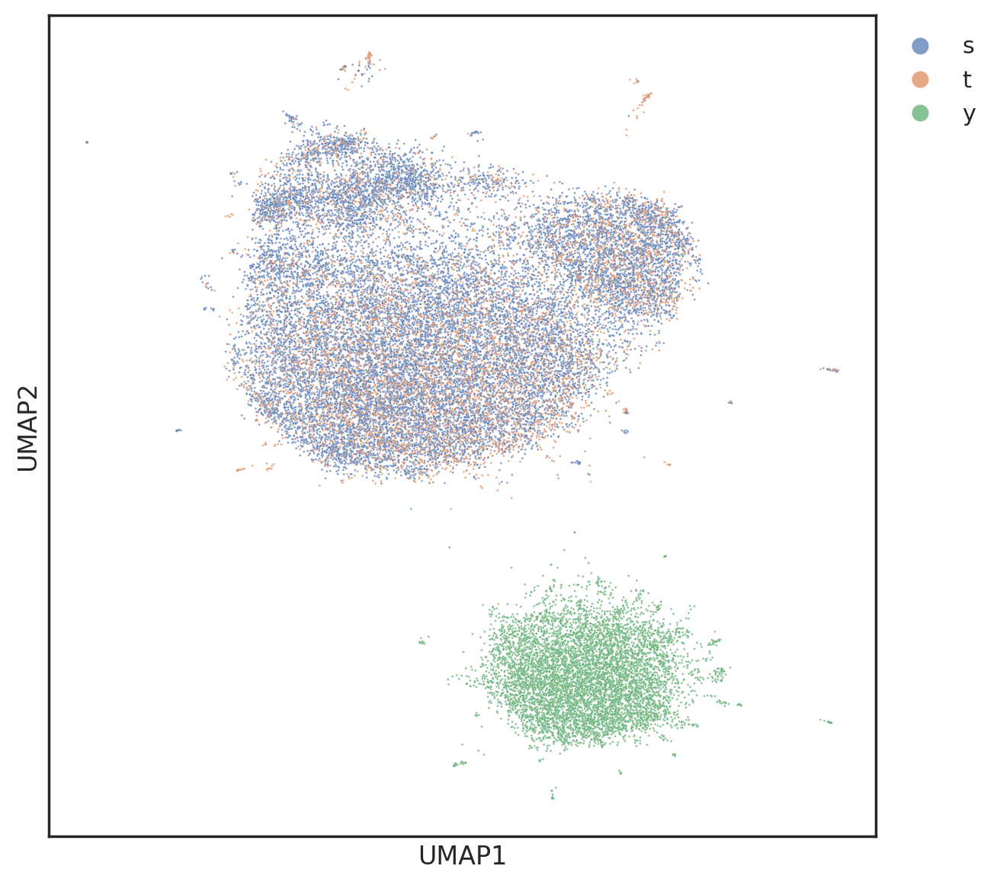

In [ ]:
plot_2d_style(embedding_df,s=1,hue=df[SEQ_COL].str[7])

/tmp/ipykernel_7561/2523523824.py:7: UserWarning: The palette list has more values (24) than needed (9), which may not be intended.
  sns.scatterplot(data = X,x=X.columns[0],y=X.columns[1],alpha=0.7,**kwargs)


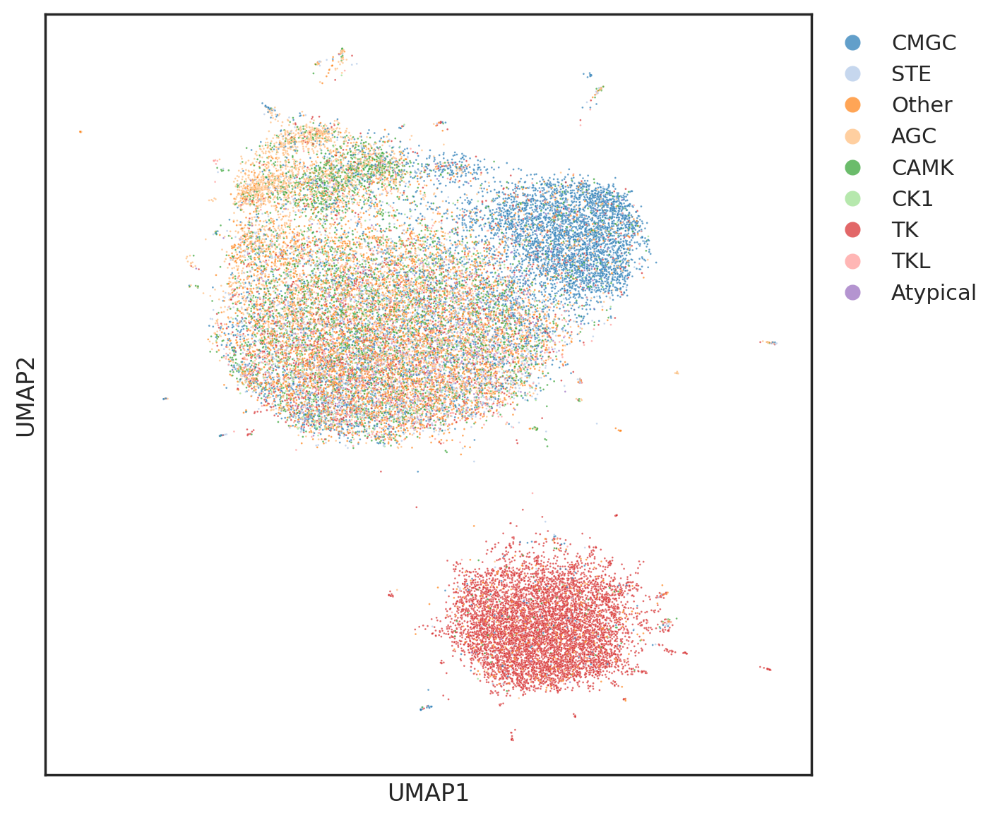

In [ ]:
plot_2d_style(embedding_df,s=1,hue=group_hue,palette=tab20bc)

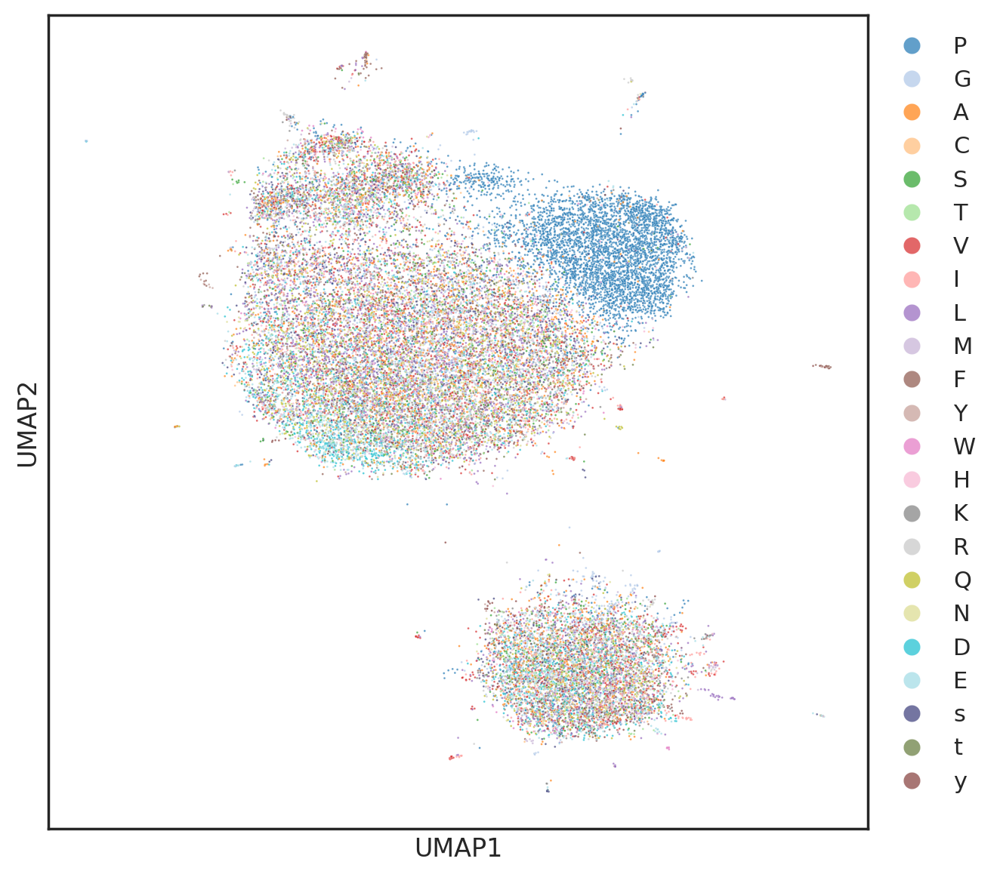

In [ ]:
plot_2d_style(embedding_df,s=1,hue=df[SEQ_COL].str[8],palette=tab20bc,hue_order=hue_order)

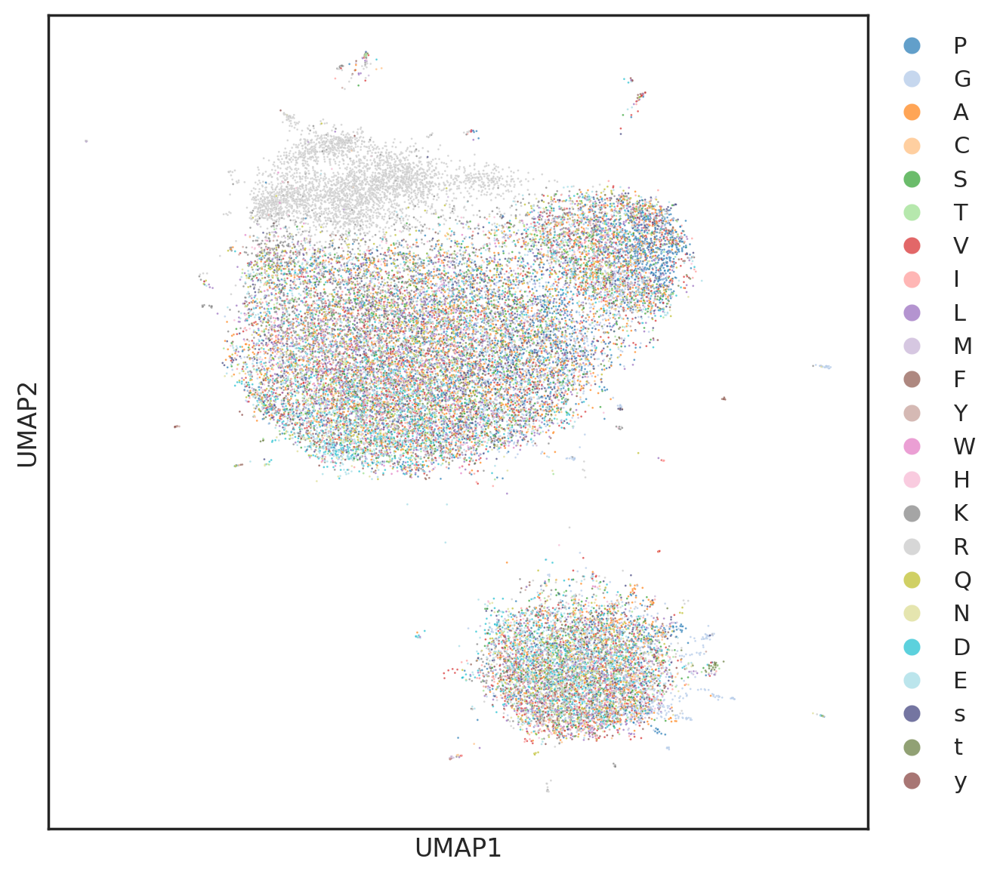

In [ ]:
plot_2d_style(embedding_df,s=1,hue=df[SEQ_COL].str[4],palette=tab20bc,hue_order=hue_order)

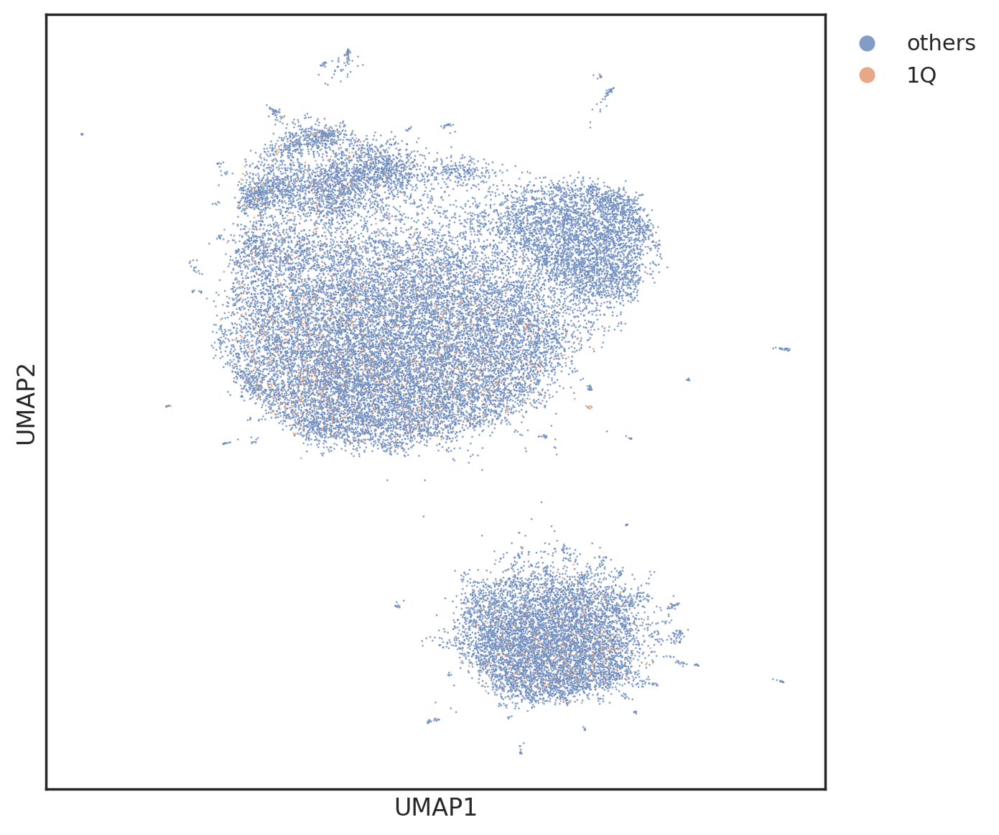

In [ ]:
plot_2d_style(embedding_df,s=1,hue=Qlabel)

A little bit more seperation in terms of +1P group

## Onehot + physicochemical

In [ ]:
comb = pd.concat([onehot,encoded],axis=1)

In [ ]:
comb_emb=reduce_feature(comb,'umap')

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/logomaker/../umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


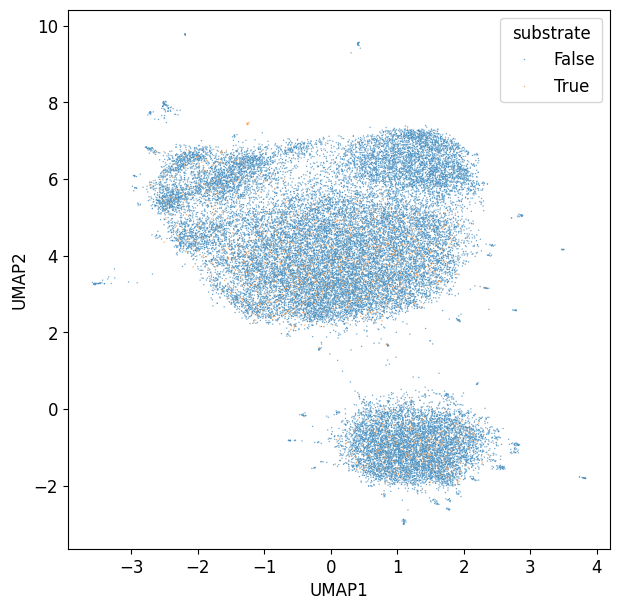

In [ ]:
plot_2d(comb_emb,s=1,hue=df[SEQ_COL].str[8]=="Q")

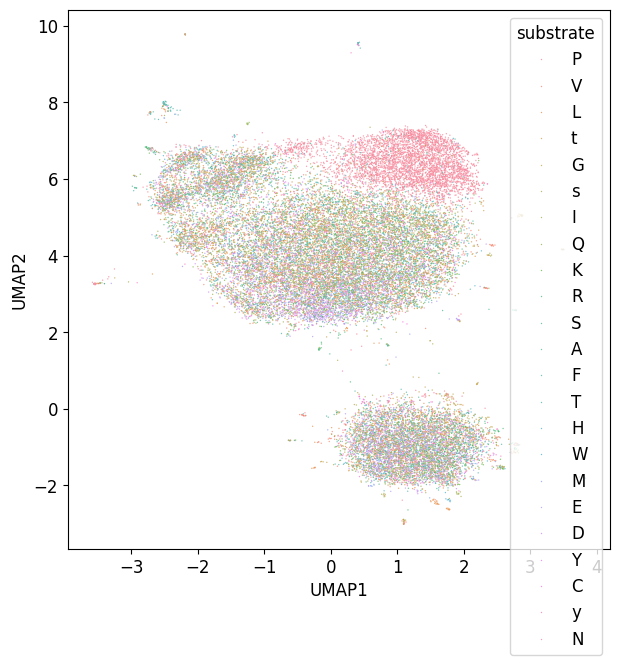

In [ ]:
plot_2d(comb_emb,s=1,hue=df[SEQ_COL].str[8])

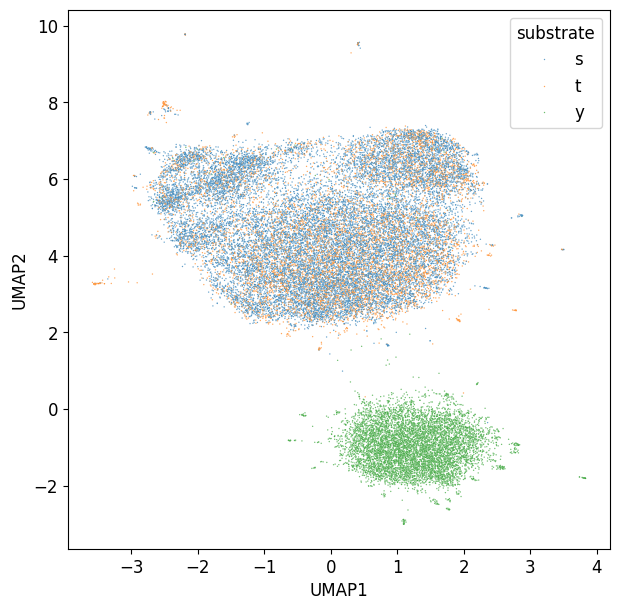

In [ ]:
plot_2d(comb_emb,s=1,hue=df[SEQ_COL].str[7])

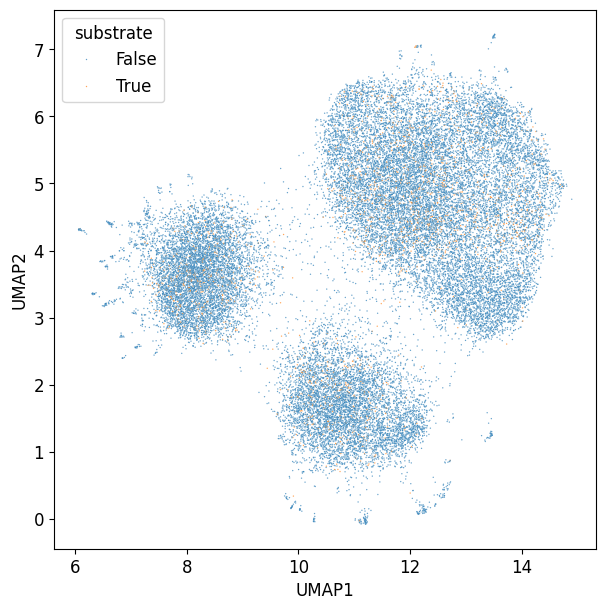

In [ ]:
plot_2d(onehot_pos_emb,s=1,hue=df[SEQ_COL].str[8]=="Q")

No much difference with the physiochemical alone

## PSPA motif encoded

## Transformer based

## Plot interactions: onehot + kinase features